# Testing notebook for nifty fit on atmosphere TODs directly (no image)

# Try to add a nifty model for sampling the input map

numpy version: 2.1.1


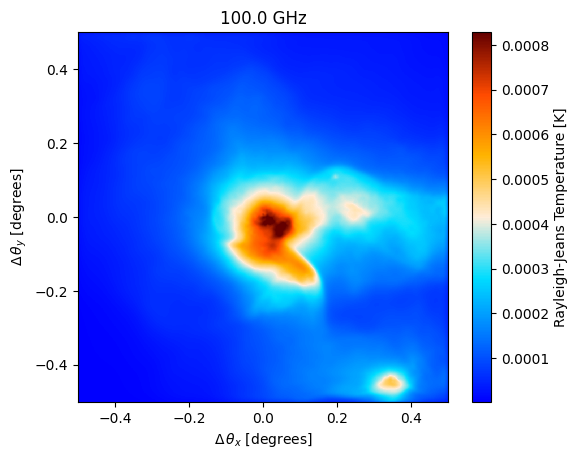

In [1]:
import numpy as np
print(f"numpy version: {np.__version__}")
import matplotlib.pyplot as plt
import maria
import sys
import os

# Relative import of sample_maps for now
sys.path.append(os.path.abspath('../python'))
import mapsampling_jax
from mapsampling_jax import sample_maps

map_filename = maria.io.fetch("maps/big_cluster.fits")

# load in the map from a fits file
input_map = maria.map.read_fits(filename=map_filename,
                                width=1., #degrees
                                index=1,
                                center=(300.0, -10.0), #RA and Dec in degrees
                                units ='Jy/pixel'
                               )

input_map.to(units="K_RJ").plot()

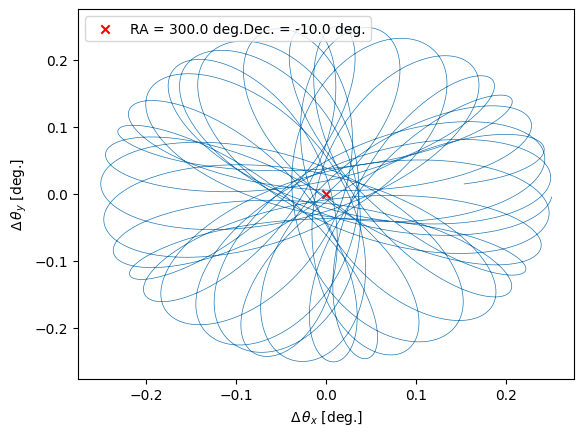

In [2]:
plan = maria.get_plan(scan_pattern="daisy",
                      scan_options={"radius": 0.25, "speed": 0.5}, # in degrees
                      duration=60, # in seconds
                      sample_rate=225, # in Hz
                        # sample_rate=20, # in Hz
                      start_time = "2022-08-10T06:00:00",
                      scan_center=(300.0, -10.0),
                      frame="ra_dec")
plan.plot()

2024-10-10 13:06:39.990 INFO: Constructed instrument.
2024-10-10 13:06:39.991 INFO: Constructed plan.
2024-10-10 13:06:39.992 INFO: Constructed site.
2024-10-10 13:06:40.701 INFO: Constructed boresight.
2024-10-10 13:06:46.010 INFO: Constructed offsets.


Initialized base in 6019 ms.


Generating noise: 100%|██████████| 1/1 [00:08<00:00,  9.00s/it]
Generating atmosphere: 4it [00:08,  2.17s/it]
Sampling map (f092): 100%|██████████| 1/1 [00:55<00:00, 55.42s/it]


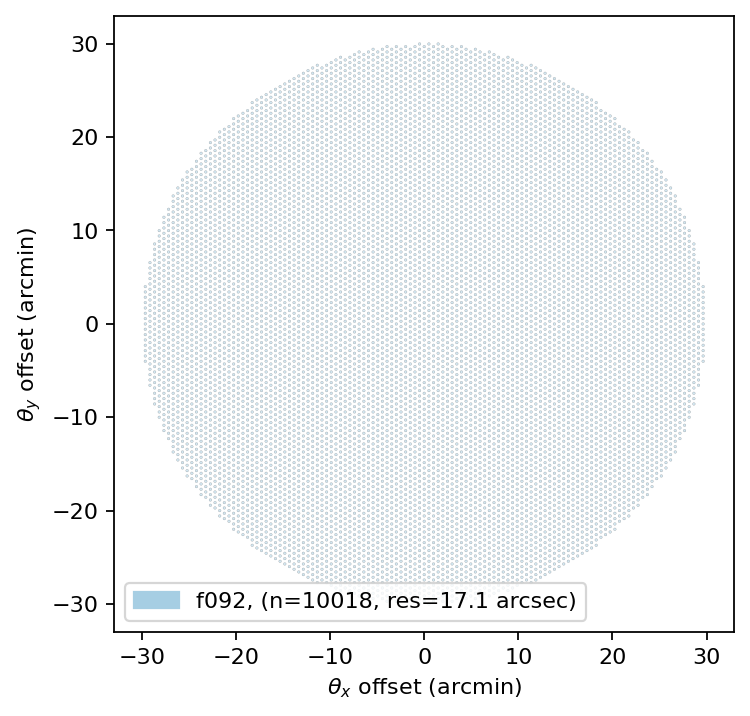

In [3]:
# instrument = maria.get_instrument('MUSTANG-2')
instrument = mapsampling_jax.get_atlast()
instrument.plot()

sim_truthmap = maria.Simulation(instrument, 
                                plan=plan,
                                site="llano_de_chajnantor", 
                                map=input_map,
                                # noise=False,
                                atmosphere="2d",
                                # cmb="generate",
                                )

tod_truthmap = sim_truthmap.run()

In [4]:
dx, dy = sim_truthmap.coords.offsets(frame=sim_truthmap.map.frame, center=sim_truthmap.map.center)
dx = dx.compute()
dy = dy.compute()

dx

array([[0.00268416, 0.00271426, 0.00274393, ..., 0.0043777 , 0.0043816 ,
        0.00438446],
       [0.00281849, 0.00284858, 0.00287826, ..., 0.00451194, 0.00451584,
        0.00451871],
       [0.00254984, 0.00257993, 0.00260961, ..., 0.00424346, 0.00424736,
        0.00425021],
       ...,
       [0.00316056, 0.00319048, 0.00321999, ..., 0.0048615 , 0.00486524,
        0.00486794],
       [0.00948298, 0.00951318, 0.00954296, ..., 0.01117182, 0.01117582,
        0.01117878],
       [0.01081714, 0.01084717, 0.01087679, ..., 0.01251337, 0.01251721,
        0.01252001]])

Running mapper (f092): 100%|██████████| 1/1 [01:47<00:00, 107.69s/it]


mapdata_truth shape: (1, 1024, 1024)
mapdata_truth mean: 0.00013284593853240577


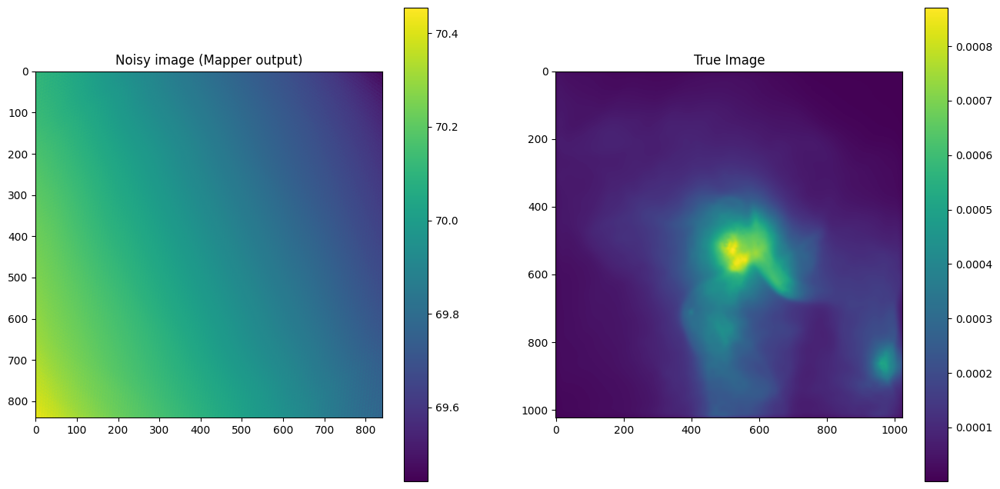

In [5]:
from maria.map.mappers import BinMapper

# Run mapper without any filtering to get noisy mimge
# mapper_truthmap = BinMapper(center=(150, 10), frame="ra_dec", width=0.1, height=0.1, resolution=2e-4, map_postprocessing={"gaussian_filter": {"sigma": 0}} )
mapper_truthmap = BinMapper(center=(300.0, -10.0), frame="ra_dec", width=1., height=1., resolution=np.degrees(np.nanmin(instrument.fwhm))/4., map_postprocessing={"gaussian_filter": {"sigma": 0} } )
mapper_truthmap.add_tods(tod_truthmap)
output_truthmap = mapper_truthmap.run()

mapdata_truth = np.float64(sim_truthmap.map.data)
mapdata_truth = np.nan_to_num(mapdata_truth, nan=np.nanmean(mapdata_truth)) # replace nan value by img mean

print("mapdata_truth shape:", mapdata_truth.shape)
print("mapdata_truth mean:", mapdata_truth.mean())

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

im0 = axes[0].imshow(output_truthmap.data[0].T)
fig.colorbar(im0)
axes[0].title.set_text("Noisy image (Mapper output)")

im1 = axes[1].imshow(mapdata_truth[0])
fig.colorbar(im1)
axes[1].title.set_text("True Image")

plt.show()

# Re-implement map sampling in JAX for nifty response function:

In [6]:
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

import jax
from jax import random
import jax.numpy as jnp

import nifty8.re as jft
import matplotlib.pyplot as plt

import numpy as np

from functools import reduce
from operator import or_

seed = 42
key = random.PRNGKey(seed)

2024-10-10 13:12:08.790 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-10 13:12:08.792 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


# Test TOD agreement:

In [7]:
sim_truthmap_x_side = jax.numpy.flip(sim_truthmap.map.x_side)
sim_truthmap_y_side = jax.numpy.flip(sim_truthmap.map.y_side)

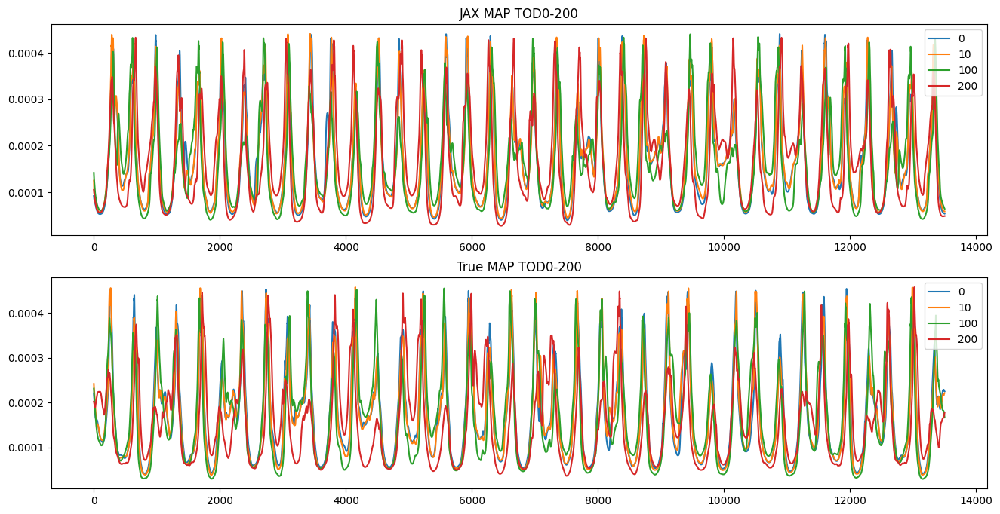

In [8]:
jax_tods_map = sample_maps(mapdata_truth, dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

fig, axes = plt.subplots(2, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    im0 = axes[0].plot(jax_tods_map[i], label=i)

    tods_map = np.float64(tod_truthmap.components['map'].compute())
    im1 = axes[1].plot(tods_map[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'True MAP TOD0-{i}')
axes[1].legend()

plt.show()

# Smooth atmosphere TODs:

In [13]:
import scipy as sp

jax_tods_atmos = tod_truthmap.components['atmosphere']
jax_tods_atmos_smooth = np.zeros(jax_tods_atmos.shape)

for i in range(jax_tods_atmos.shape[0]):
    jax_tods_atmos_smooth[i] = sp.ndimage.gaussian_filter1d(jax_tods_atmos[i], sigma=50)

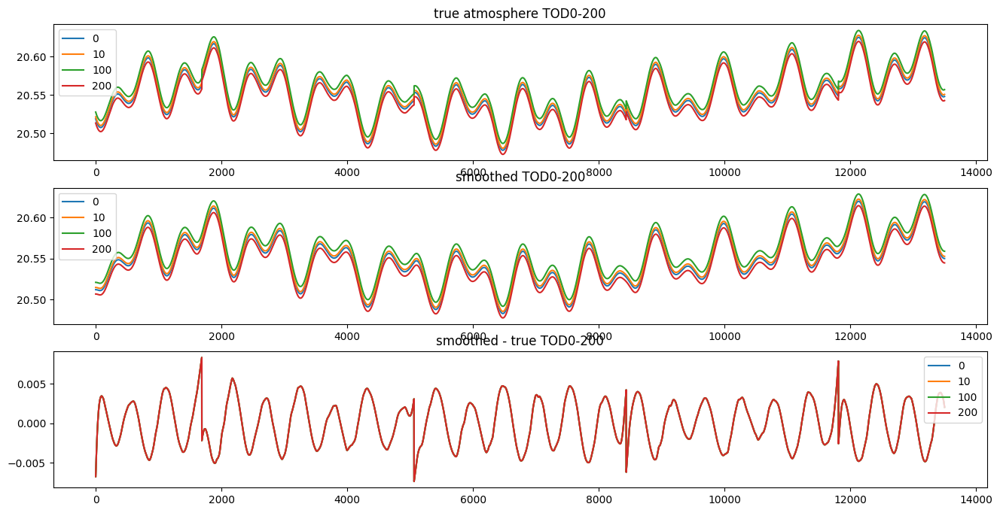

In [16]:
# plot smoothed atmos:

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0, 10, 100, 200]:
    # im0 = axes[0].plot(jax_tods_atmos[i, 0:1000], label=i)
    # im1 = axes[1].plot(jax_tods_atmos_smooth[i, 0:1000], label=i)
    # im2 = axes[2].plot(jax_tods_atmos_smooth[i, 0:1000] - jax_tods_atmos[i, 0:1000], label=i)
    im0 = axes[0].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(jax_tods_atmos_smooth[i] - jax_tods_atmos[i], label=i)
    
axes[0].title.set_text(f'true atmosphere TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'smoothed TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'smoothed - true TOD0-{i}')
axes[2].legend()

plt.show()

# Prepare noised input TODs:

Noise stddev: 0.00028093852


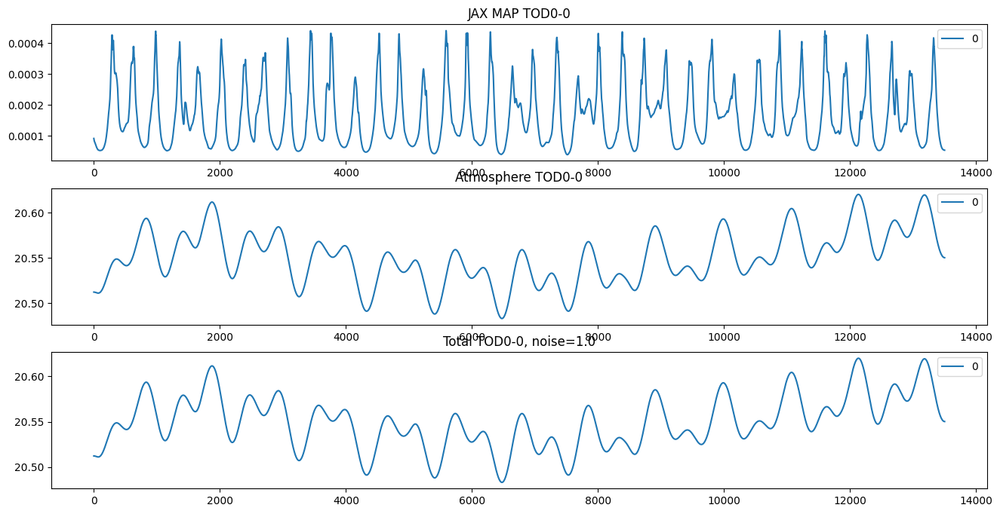

In [17]:
# Pick noise level for rest of run:
# noiselevel = 0.0
# noiselevel = 0.1
# noiselevel = 0.5
noiselevel = 1.0

# Add n TODs for atmos:
n = 1
# n = 10
# n = 100
# n = jax_tods_map.shape[0]

jax_tods_atmos = tod_truthmap.components['atmosphere']
# noised_jax_tod = np.float64(jax_tods_map) + np.float64(jax_tods_atmos) + np.float64(tod_truthmap.components['noise']*noiselevel)

noised_jax_tod = np.float64(jax_tods_map) + np.float64(tod_truthmap.components['noise']*noiselevel)
# noised_jax_tod[:n] += np.float64(jax_tods_atmos_smooth[:n]) 
noised_jax_tod[:n] = np.float64(jax_tods_atmos_smooth[:n])

denoised_jax_tod = noised_jax_tod - np.float64(tod_truthmap.components['noise']*noiselevel)

print("Noise stddev:", np.std(tod_truthmap.components['noise'].compute()))

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

for i in [0]:
# for i in range(0, n, n//10):
    im0 = axes[0].plot(jax_tods_map[i], label=i)
    # im1 = axes[1].plot(jax_tods_atmos[i], label=i)
    im1 = axes[1].plot(jax_tods_atmos_smooth[i], label=i)
    im2 = axes[2].plot(noised_jax_tod[i], label=i)
    
axes[0].title.set_text(f'JAX MAP TOD0-{i}')
axes[0].legend()
axes[1].title.set_text(f'Atmosphere TOD0-{i}')
axes[1].legend()
axes[2].title.set_text(f'Total TOD0-{i}, noise={noiselevel}')
axes[2].legend()

plt.show()

# Next, initialise nifty prior model

Start with the atmosphere TOD model:

In [18]:
dims_atmos = (jax_tods_atmos.shape[1] + 2000,)
padding_atmos = dims_atmos[0] - jax_tods_atmos.shape[1]

# correlated field zero mode GP offset and stddev
# cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.001, 0.1))
cf_zm_tod = dict(offset_mean=jax_tods_atmos.mean().compute(), offset_std=(0.0005, 0.001))

# correlated field fluctuations (mostly don't need tuning)
# fluctuations: y-offset in power spectrum in fourier space (zero mode)
# loglogavgslope: power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
# flexibility=(1.5e0, 5e-1), # deviation from simple power-law
# asperity=(5e-1, 5e-2), # small scale features in power-law
cf_fl_tod = dict(
    # fluctuations=(0.005, 0.005), 
    fluctuations=(0.005, 0.003), 
    loglogavgslope=(-3, 0.5), 
    flexibility=None,
    asperity=None,
)

# put together in correlated field model
cfm_tod = jft.CorrelatedFieldMaker("")
cfm_tod.set_amplitude_total_offset(**cf_zm_tod)
cfm_tod.add_fluctuations(
    dims_atmos, distances=1.0 / dims_atmos[0], **cf_fl_tod, prefix="tod ", non_parametric_kind="power"
)
# gp_tod = cfm_tod.finalize()

## Add one Correlated field per TOD with shared flucts and zero-mean

In [19]:
# init params for each TOD:

gps_tods = []
for i in range(n):
    cfmi = jft.CorrelatedFieldMaker(f'tod{i} ')
    # cfmi.set_amplitude_total_offset(**cf_zm_tod)
    cfmi._azm = cfm_tod._azm
    cfmi._offset_mean = cfm_tod._offset_mean
    cfmi._parameter_tree['zeromode'] = jft.ShapeWithDtype(())

    cfmi._fluctuations.append(cfm_tod._fluctuations[0])
    cfmi._target_grids.append(cfm_tod._target_grids[0])
    cfmi._parameter_tree.update(cfm_tod._fluctuations[0].domain)
    gps_tods.append(cfmi.finalize())

## Now for the map model:

In [20]:
dims_map = (mapdata_truth.shape[1] + 200, mapdata_truth.shape[2] + 200)
padding_map = dims_map[0] - mapdata_truth.shape[1]

# Map model

# correlated field zero mode GP offset and stddev
# cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-7, 1e-6))
cf_zm_map = dict(offset_mean=mapdata_truth.mean(), offset_std=(1e-8, 1e-7))
# correlated field fluctuations (mostly don't need tuning)
cf_fl_map = dict(
    # fluctuations=(2e-6, 1e-6), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    fluctuations=(3e-5, 1e-5), # fluctuations: y-offset in power spectrum in fourier space (zero mode)
    loglogavgslope=(-2.5e0, 5e-1), # power-spectrum slope in log-log space in frequency domain (Fourier space) Jakob: -4 -- -2
    flexibility=None,
    asperity=None,
    # flexibility=(1.5e0, 5e-1), # deviation from simple power-law
    # asperity=(5e-1, 5e-2), # small scale features in power-law
)

# put together in correlated field model
cfm_map = jft.CorrelatedFieldMaker("cfmap")
cfm_map.set_amplitude_total_offset(**cf_zm_map)
cfm_map.add_fluctuations(
    dims_map, distances=1.0 / dims_map[0], **cf_fl_map, prefix="ax1", non_parametric_kind="power"
)
gp_map = cfm_map.finalize()

In [21]:
# only tod:
class Signal_TOD(jft.Model):
    def __init__(self, gps_tods):
        # self.gp_tod = gp_tod
        # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
        self.gps_tods = gps_tods
        self.tgt = (len(gps_tods), gps_tods[0].target.size)
        # self.gp_map = gp_map
        # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
        super().__init__(init=reduce(or_, [gp.init for gp in gps_tods]), domain=reduce(or_, [gp.domain for gp in gps_tods]))
    
    def __call__(self, x):
        res_tods = jnp.zeros(self.tgt)
        for i, gp in enumerate(self.gps_tods):
            res_tods = res_tods.at[i].set(gp(x))
        
        return res_tods[:, padding_atmos//2:-padding_atmos//2]

        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

        # # Only add first n atmosphere tods, otherwise use map
        # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

        # return modified_res_map

signal_response_tod = Signal_TOD(gps_tods)

# map only:
# class Signal_TOD(jft.Model):
#     def __init__(self, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         # self.gps_tods = gps_tods
#         # self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         # super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
#         super().__init__(init=gp_map.init, domain=gp_map.domain)
    
#     def __call__(self, x):
#         # res_tods = jnp.zeros(self.tgt)
#         # for i, gp in enumerate(self.gps_tods):
#         #     res_tods = res_tods.at[i].set(gp(x))
        
#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
#         res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
#         return res_map

#         # Only add first n atmosphere tods, otherwise use map
#         # modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         # return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]
  
# signal_response_tod = Signal_TOD(gp_map)

In [34]:
# Define simple signal model with added map sampling
# class Signal_TOD(jft.Model):
#     def __init__(self, gps_tods, gp_map):
#         # self.gp_tod = gp_tod
#         # super().__init__(init=self.gp_tod.init, domain=jft.Vector(gp_tod.domain))
#         self.gps_tods = gps_tods
#         self.tgt = (len(gps_tods), gps_tods[0].target.size)
#         self.gp_map = gp_map
#         super().__init__(init=reduce(or_, [gp.init for gp in gps_tods] + [gp_map.init]), domain=reduce(or_, [gp.domain for gp in gps_tods] + [gp_map.domain]))
    
#     def __call__(self, x):
#         res_tods = jnp.zeros(self.tgt)
#         for i, gp in enumerate(self.gps_tods):
#             res_tods = res_tods.at[i].set(gp(x))
        
#         # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1])), dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)
        # res_map = sample_maps(jax.numpy.broadcast_to(self.gp_map(x), (1, dims_map[0], dims_map[1]))[:, padding_map//2:-padding_map//2, padding_map//2:-padding_map//2], dx, dy, sim_truthmap.map.resolution, sim_truthmap_x_side, sim_truthmap_y_side)

#         # Only add first n atmosphere tods, otherwise use map
#         modified_res_map = res_map.at[:n, :].add(res_tods[:, padding_atmos//2:-padding_atmos//2])

#         return modified_res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map
#         # return res_tods[:, padding_atmos//2:-padding_atmos//2] + res_map[:n]

# signal_response_tod = Signal_TOD(gps_tods, gp_map)

# Define noise covariance
# if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x
if noiselevel == 0.0: noise_cov_inv_tod = lambda x: 1e-8**-2 * x
elif noiselevel == 0.1: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 0.5: noise_cov_inv_tod = lambda x: 1e-4**-2 * x
elif noiselevel == 1.0: noise_cov_inv_tod = lambda x: 2.5e-4**-2 * x

# Combine in likelihood - only fit 0th TOD for now!
truth = noised_jax_tod[:n]
# truth = noised_jax_tod
lh_tod = jft.Gaussian( truth, noise_cov_inv_tod).amend(signal_response_tod)

# lh = lh_tod + lh_map
# lh = lh_map
lh = lh_tod

# lh_map_grad = jax.grad(lh_map)
lh_tod_grad = jax.grad(lh_tod)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


In [35]:
signal_response_tod

Signal_TOD(
	<bound method Signal_TOD.__call__>,
	domain={'tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'tod0 xi': ShapeWithDtype(shape=(15500,), dtype=<class 'jax.numpy.float64'>),
	 'zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'tod fluctuations': functools.partial(<function random_like at 0x7f9b4c528b80>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'tod loglogavgslope': functools.partial(<function random_like at 0x7f9b4c528b80>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'tod0 xi': functools.partial(<function random_like at 0x7f9b4c528b80>, primals=ShapeWithDtype(shape=(15500,), dtype=<class 'jax.numpy.float64'>)),
		 'zeromode': functools.partial(<function random_like at 0x7f9b4c528b80>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>))

# Draw Prior sample

(1, 13500)


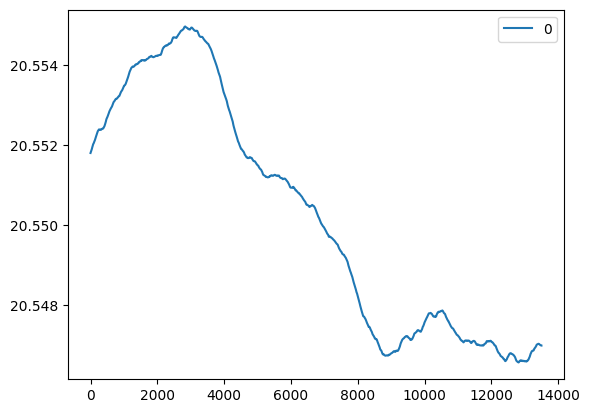

In [36]:
key, sub = jax.random.split(key)
xi = jft.random_like(sub, signal_response_tod.domain)
res = signal_response_tod(xi)
print(res.shape)

# for i in range(res.shape[0]):
# for i in range(0, n, n//10):
for i in [0]:
    plt.plot(np.arange(0, res.shape[1]), res[i], label=i)
plt.legend()
plt.show()

# MAP fit

In [37]:
n_it = 1
# delta = 1e-4 # default
# delta = 1e-8 # map
# tod
if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4

n_samples = 0 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60 # map
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=20 # map
        )
    ),
    sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
)

OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:1.748102e+02 ➽:1.550300e+00
M: Iteration 1 ⛰:+7.043576e+07 Δ⛰:3.187773e+07
M: →:0.03125 ↺:False #∇²:12 |↘|:2.274349e+01 ➽:1.550300e+00
M: Iteration 2 ⛰:+7.017422e+07 Δ⛰:2.615379e+05
M: →:0.03125 ↺:False #∇²:18 |↘|:2.396902e+01 ➽:1.550300e+00
M: Iteration 3 ⛰:+6.871962e+07 Δ⛰:1.454601e+06
M: →:0.25 ↺:False #∇²:24 |↘|:4.222074e+02 ➽:1.550300e+00
M: Iteration 4 ⛰:+3.487792e+07 Δ⛰:3.384170e+07
M: →:0.5 ↺:False #∇²:30 |↘|:2.613510e+02 ➽:1.550300e+00
M: Iteration 5 ⛰:+1.608191e+07 Δ⛰:1.879601e+07
M: →:1.0 ↺:False #∇²:36 |↘|:1.261567e+02 ➽:1.550300e+00
M: Iteration 6 ⛰:+2.377462e+06 Δ⛰:1.370445e+07
M: →:1.0 ↺:False #∇²:42 |↘|:2.946855e+01 ➽:1.550300e+00
M: Iteration 7 ⛰:+5.406809e+05 Δ⛰:1.836781e+06
M: →:0.5 ↺:False #∇²:48 |↘|:5.107152e+01 ➽:1.550300e+00
M: Iteration 8 ⛰:+3.662795e+05 Δ⛰:1.744014e+05
M: →:1.0 ↺:False #∇²:54 |↘|:2.521544e+01 ➽:1.550300e+00
M: Iteration 9 ⛰:+2.886846e+05 Δ⛰:7.759497e+04
M: →:1.0 ↺:False #∇²:60 |↘|:1.108564e

In [38]:
samples.pos

Vector(
	{'tod fluctuations': Array(1.43978662, dtype=float64),
	 'tod loglogavgslope': Array(2.22779971, dtype=float64),
	 'tod0 xi': Array([-2.39749769,  1.65368363, -2.56685881, ..., -5.70259261,
	       -4.39551139,  0.48938968], dtype=float64),
	 'zeromode': Array(1.56509888, dtype=float64)}
)

In [39]:
def printfitresults():
    print("Fit Results (res, init, std)")

    print("\nTODs:")
    print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_tod['fluctuations'])(samples.pos['tod fluctuations'])}, {cf_fl_tod['fluctuations'][0]}, {cf_fl_tod['fluctuations'][1]}")
    print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_tod['loglogavgslope'])(samples.pos['tod loglogavgslope'])}, {cf_fl_tod['loglogavgslope'][0]}, {cf_fl_tod['loglogavgslope'][1]}")
    print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_tod['offset_std'])(samples.pos['zeromode'])}, {cf_zm_tod['offset_std'][0]}, {cf_zm_tod['offset_std'][1]}")

    # If custom zeromode per TOD:
    # for i in range(n):
    #     test = samples.pos[f"tod{i} zeromode"]
    #     print(f"tod{i} zeromode: {jft.LogNormalPrior(cf_zm_tod['offset_mean'], cf_zm_tod['offset_std'][0])(test)}, {cf_zm_tod['offset_mean']}, {cf_zm_tod['offset_std'][0]}")
    
    # print("map:")
    # print(f"\tfluctuations: {jft.LogNormalPrior(*cf_fl_map['fluctuations'])(samples.pos['cfmapax1fluctuations'])}, {cf_fl_map['fluctuations'][0]}, {cf_fl_map['fluctuations'][1]}")
    # print(f"\tloglogvarslope: {jft.NormalPrior(*cf_fl_map['loglogavgslope'])(samples.pos['cfmapax1loglogavgslope'])}, {cf_fl_map['loglogavgslope'][0]}, {cf_fl_map['loglogavgslope'][1]}")
    # print(f"\tzeromode std (LogNormal): {jft.LogNormalPrior(*cf_zm_map['offset_std'])(samples.pos['cfmapzeromode'])}, {cf_zm_map['offset_std'][0]}, {cf_zm_map['offset_std'][1]}")
    
    
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.009526486820944162, 0.005, 0.003
	loglogvarslope: -1.8861001469312533, -3, 0.5
	zeromode std (LogNormal): 0.001628525532805527, 0.0005, 0.001


(1, 13500)


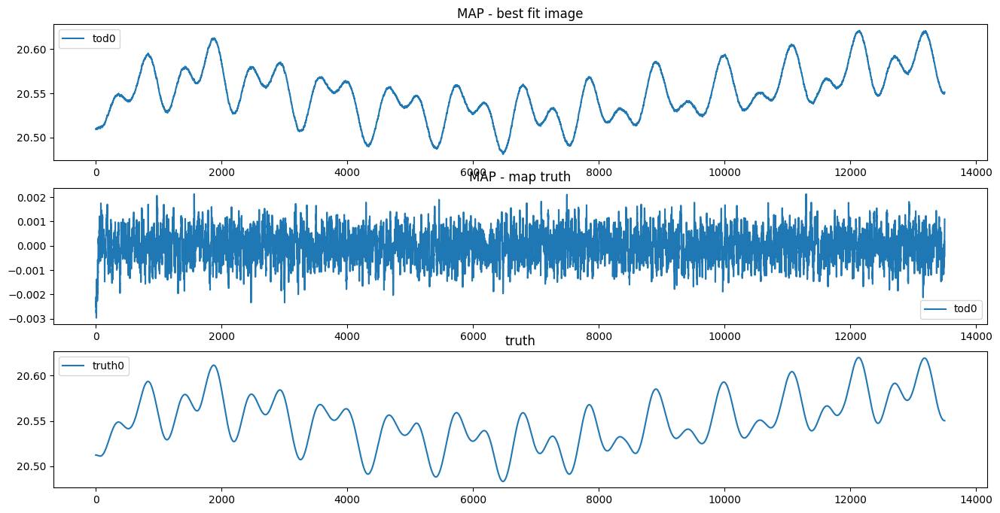

In [40]:
res = signal_response_tod(samples.pos)
print(res.shape)

fig, axes = plt.subplots(3, 1, figsize=(16, 8))

# for i in range(0, res.shape[0], res.shape[0]//10):
# for i in range(0, n, n//10):
for i in [0]:
    im0 = axes[0].plot(np.arange(0, res.shape[1]), res[i], label=f"tod{i}")
    im1 = axes[1].plot(np.arange(0, res.shape[1]), res[i] - truth[i], label=f"tod{i}")
    im2 = axes[2].plot(truth[i], label=f"truth{i}")

axes[0].title.set_text('MAP - best fit image')
axes[0].legend()
axes[1].title.set_text('MAP - map truth')
axes[1].legend()
axes[2].title.set_text('truth')
axes[2].legend()

plt.show()

In [41]:
# # plot maximum of posterior (mode)
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models

# fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# im0 = axes[0].imshow(sig_map)
# axes[0].title.set_text('MAP - best fit image')
# fig.colorbar(im0)

# im1 = axes[1].imshow( sig_map - mapdata_truth[0] )
# axes[1].title.set_text('MAP - map truth')
# # im1 = axes[1].imshow( (sig_map - mapdata_truth) )
# # axes[1].title.set_text('diff prediction - map truth')
# fig.colorbar(im1)

# plt.show()

In [42]:
# assert False

## Full nifty fit:

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+1.0301e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.7098e+05 Δ⛰:9.9302e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.3680e+04 Δ⛰:3.1730e+05 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.9987e+04 Δ⛰:2.3693e+04 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.8500e+04 Δ⛰:1.1487e+04 ➽:1.5503e-01
SL: Iteration 5 ⛰:+8.5652e+03 Δ⛰:9.9350e+03 ➽:1.5503e-01
SL: Iteration 6 ⛰:-3.2742e+03 Δ⛰:1.1839e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:-4.1772e+03 Δ⛰:9.0303e+02 ➽:1.5503e-01
SL: Iteration 8 ⛰:-5.0707e+03 Δ⛰:8.9350e+02 ➽:1.5503e-01
SL: Iteration 9 ⛰:-5.1758e+03 Δ⛰:1.0508e+02 ➽:1.5503e-01
SL: Iteration 10 ⛰:-5.5748e+03 Δ⛰:3.9901e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:-5.7703e+03 Δ⛰:1.9554e+02 ➽:1.5503e-01
SL: Iteration 12 ⛰:-5.7796e+03 Δ⛰:9.2744e+00 ➽:1.5503e-01
SL: Iteration 13 ⛰:-6.4404e+03 Δ⛰:6.6083e+02 ➽:1.5503e-01
SL: Iteration 14 ⛰:-6.8157e+03 Δ⛰:3.7524e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:-6.8408e+03 Δ⛰:2.5107e+01 ➽:1.5503e-01
SL: Iteration 16 ⛰:-6.9872e+03 Δ⛰:1.4640e+02 ➽:1.5503e-01
SL: 

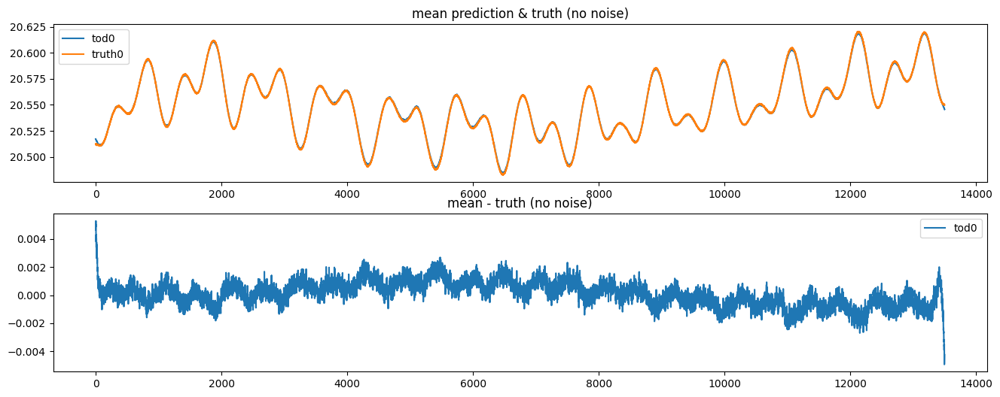

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+2.2191e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+7.4580e+06 Δ⛰:2.1445e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.0130e+06 Δ⛰:6.4451e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+6.5087e+05 Δ⛰:3.6209e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+3.5863e+05 Δ⛰:2.9224e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.1854e+05 Δ⛰:4.0089e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.0264e+05 Δ⛰:1.1590e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.4351e+05 Δ⛰:5.9129e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4200e+05 Δ⛰:1.5114e+03 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.2059e+05 Δ⛰:2.1413e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+8.4554e+04 Δ⛰:3.6034e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+7.4184e+04 Δ⛰:1.0370e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+7.3567e+04 Δ⛰:6.1619e+02 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.8757e+04 Δ⛰:4.8106e+03 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.5137e+04 Δ⛰:1.3620e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.5113e+04 Δ⛰:2.4385e+01 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.4603e+04 Δ⛰:1.0510e+04 ➽:1.5503e-01
SL: 

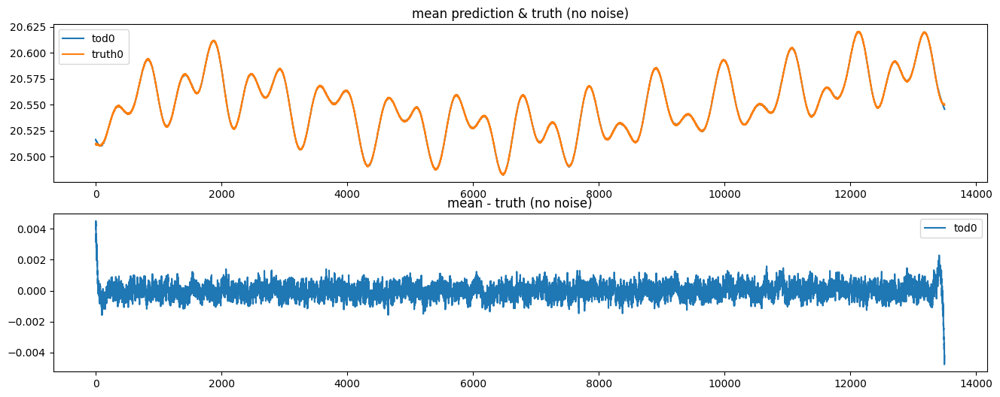

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+8.2244e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.1220e+06 Δ⛰:7.1023e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+6.9127e+05 Δ⛰:4.3078e+05 ➽:1.5503e-01
SL: Iteration 3 ⛰:+3.6363e+05 Δ⛰:3.2764e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.5184e+05 Δ⛰:1.1179e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.9441e+05 Δ⛰:5.7427e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+1.3195e+05 Δ⛰:6.2464e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.0843e+05 Δ⛰:2.3519e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+9.8289e+04 Δ⛰:1.0143e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+8.8330e+04 Δ⛰:9.9588e+03 ➽:1.5503e-01
SL: Iteration 10 ⛰:+7.7061e+04 Δ⛰:1.1268e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+6.2165e+04 Δ⛰:1.4896e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+5.8041e+04 Δ⛰:4.1246e+03 ➽:1.5503e-01
SL: Iteration 13 ⛰:+5.0677e+04 Δ⛰:7.3643e+03 ➽:1.5503e-01
SL: Iteration 14 ⛰:+4.1613e+04 Δ⛰:9.0635e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.1572e+04 Δ⛰:4.0965e+01 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.3811e+04 Δ⛰:7.7607e+03 ➽:1.5503e-01
SL: 

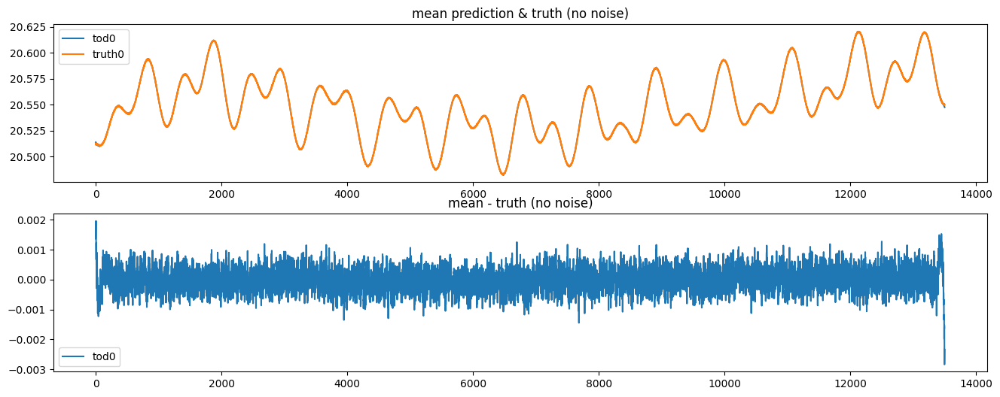

OPTIMIZE_KL: Starting 0004
SL: Iteration 0 ⛰:+1.3588e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+7.2455e+06 Δ⛰:6.3426e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.7950e+06 Δ⛰:5.4505e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.0460e+06 Δ⛰:7.4896e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+6.4004e+05 Δ⛰:4.0599e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+5.3626e+05 Δ⛰:1.0378e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.7432e+05 Δ⛰:2.6194e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.8619e+05 Δ⛰:8.8136e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.5040e+05 Δ⛰:3.5783e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4823e+05 Δ⛰:2.1731e+03 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.3324e+05 Δ⛰:1.4987e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.8600e+04 Δ⛰:3.4644e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.9336e+04 Δ⛰:9.2639e+03 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.2626e+04 Δ⛰:6.7095e+03 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.9495e+04 Δ⛰:2.3132e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.9080e+04 Δ⛰:1.0414e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.8478e+04 Δ⛰:6.0217e+02 ➽:1.5503e-01
SL: 

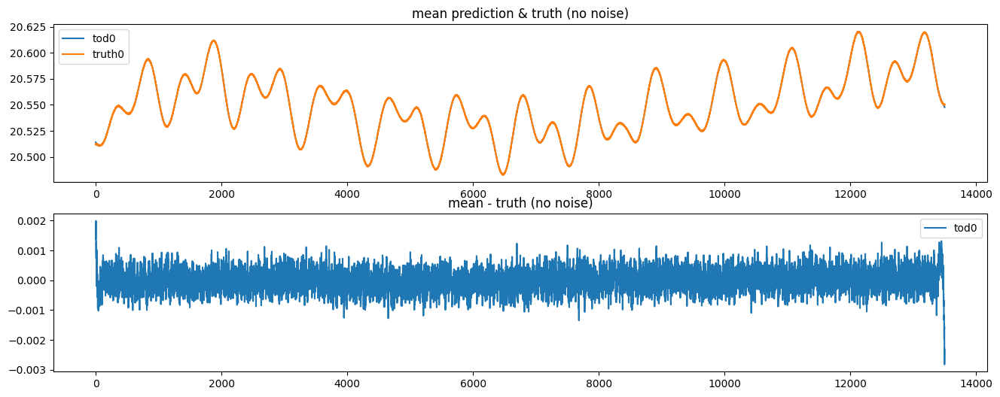

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+4.4607e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.6318e+06 Δ⛰:8.2890e+05 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.2322e+06 Δ⛰:1.3996e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.0960e+06 Δ⛰:1.1363e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+3.7715e+05 Δ⛰:7.1880e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.3406e+05 Δ⛰:4.3096e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.1093e+05 Δ⛰:1.2313e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.7110e+05 Δ⛰:3.9831e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4368e+05 Δ⛰:2.7419e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.3618e+05 Δ⛰:7.5018e+03 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2146e+05 Δ⛰:1.4716e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.1212e+04 Δ⛰:3.0249e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+6.9217e+04 Δ⛰:2.1995e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.8121e+04 Δ⛰:1.0962e+03 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.4799e+04 Δ⛰:1.3321e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+3.8303e+04 Δ⛰:1.6496e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.8270e+04 Δ⛰:3.3368e+01 ➽:1.5503e-01
SL: 

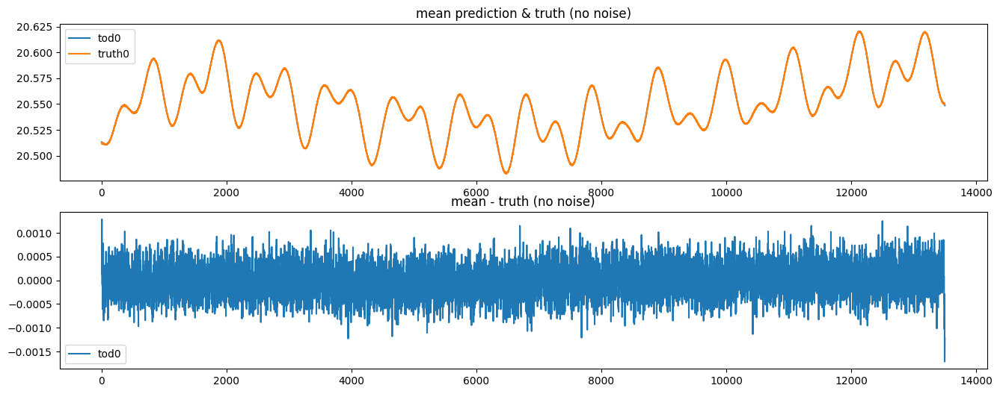

OPTIMIZE_KL: Starting 0006
SL: Iteration 0 ⛰:+1.8428e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.3875e+07 Δ⛰:1.7041e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.4725e+06 Δ⛰:9.4026e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+8.8511e+05 Δ⛰:3.5874e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+4.8551e+05 Δ⛰:3.9960e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.8073e+05 Δ⛰:1.0478e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.6510e+05 Δ⛰:1.1564e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.7287e+05 Δ⛰:9.2226e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4816e+05 Δ⛰:2.4714e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4278e+05 Δ⛰:5.3780e+03 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2249e+05 Δ⛰:2.0287e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+7.4897e+04 Δ⛰:4.7595e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+6.5946e+04 Δ⛰:8.9510e+03 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.5771e+04 Δ⛰:1.7517e+02 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.4238e+04 Δ⛰:1.1532e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.2682e+04 Δ⛰:1.5568e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.2743e+04 Δ⛰:9.9382e+03 ➽:1.5503e-01
SL: 

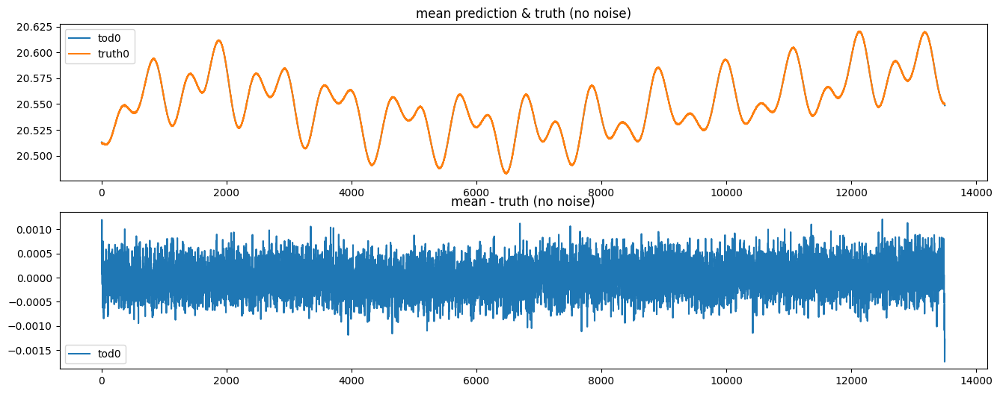

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+1.9829e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.5914e+06 Δ⛰:1.6238e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.3240e+06 Δ⛰:1.2674e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.4612e+06 Δ⛰:8.6281e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+4.9415e+05 Δ⛰:9.6704e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.8698e+05 Δ⛰:1.0717e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.6679e+05 Δ⛰:1.2019e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.3169e+05 Δ⛰:3.5102e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4882e+05 Δ⛰:8.2872e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4857e+05 Δ⛰:2.4521e+02 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.0072e+05 Δ⛰:4.7846e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+8.0029e+04 Δ⛰:2.0696e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+6.7474e+04 Δ⛰:1.2554e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+5.7531e+04 Δ⛰:9.9436e+03 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.3343e+04 Δ⛰:4.1876e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.2815e+04 Δ⛰:1.0528e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.2114e+04 Δ⛰:7.0125e+02 ➽:1.5503e-01
SL: 

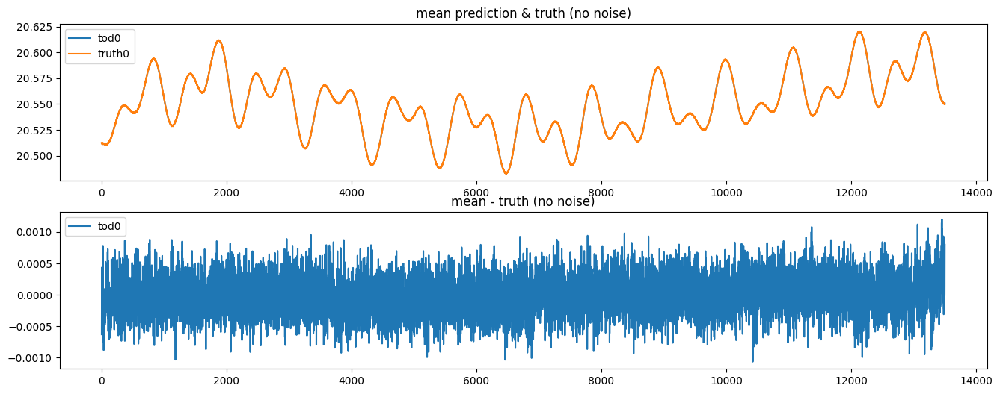

OPTIMIZE_KL: Starting 0008
SL: Iteration 0 ⛰:+2.3033e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.8334e+06 Δ⛰:1.9199e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.5673e+06 Δ⛰:1.2661e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.1202e+06 Δ⛰:1.4471e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+7.8009e+05 Δ⛰:3.4007e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+5.8092e+05 Δ⛰:1.9917e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.3743e+05 Δ⛰:2.4349e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.1575e+05 Δ⛰:1.2168e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.7746e+05 Δ⛰:3.8286e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4866e+05 Δ⛰:2.8806e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4831e+05 Δ⛰:3.4841e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.0896e+05 Δ⛰:3.9352e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.0961e+04 Δ⛰:2.7994e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.0115e+04 Δ⛰:8.4619e+02 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.7355e+04 Δ⛰:2.2760e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.5707e+04 Δ⛰:1.1648e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.9680e+04 Δ⛰:6.0270e+03 ➽:1.5503e-01
SL: 

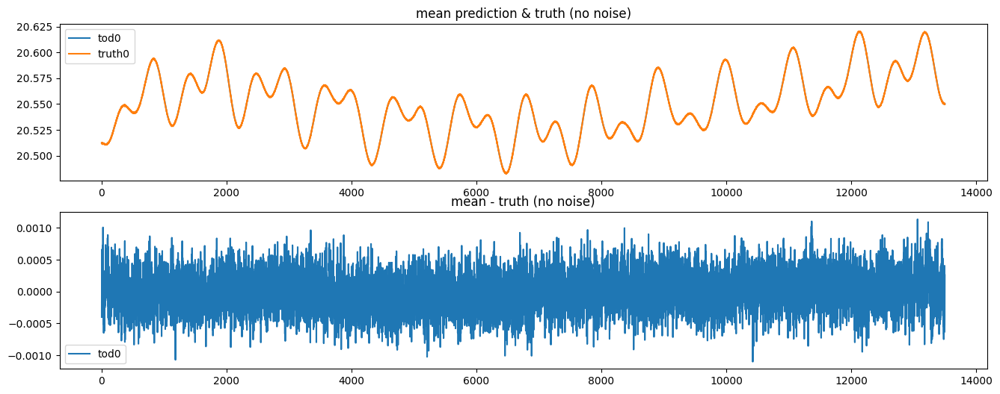

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+2.7869e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.2637e+07 Δ⛰:1.5231e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.8592e+06 Δ⛰:6.7781e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.3645e+06 Δ⛰:4.4947e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+8.2250e+05 Δ⛰:5.4203e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.5730e+05 Δ⛰:4.6520e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.1798e+05 Δ⛰:1.3931e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.6898e+05 Δ⛰:4.9003e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4223e+05 Δ⛰:2.6752e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.0576e+05 Δ⛰:3.6462e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.0276e+05 Δ⛰:3.0020e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+7.9277e+04 Δ⛰:2.3485e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+5.6861e+04 Δ⛰:2.2416e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+5.6649e+04 Δ⛰:2.1220e+02 ➽:1.5503e-01
SL: Iteration 14 ⛰:+4.1832e+04 Δ⛰:1.4816e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+3.7230e+04 Δ⛰:4.6025e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.5307e+04 Δ⛰:1.9232e+03 ➽:1.5503e-01
SL: 

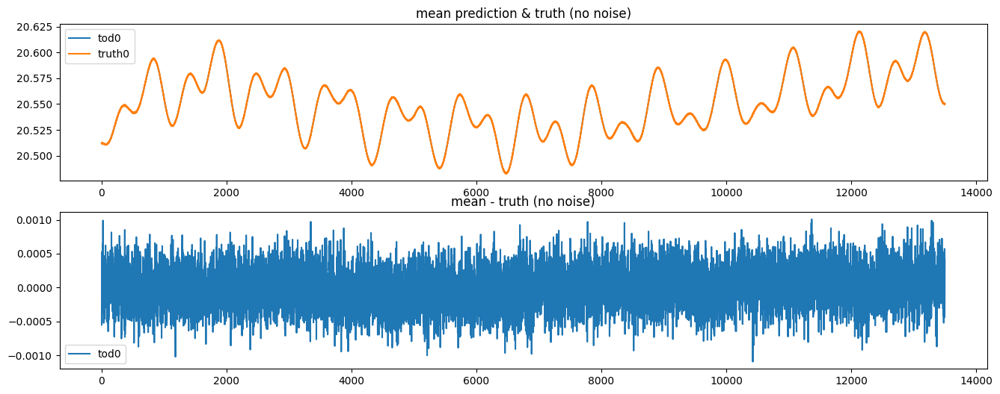

OPTIMIZE_KL: Starting 0010
SL: Iteration 0 ⛰:+1.7203e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.0518e+07 Δ⛰:1.4151e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+6.8061e+06 Δ⛰:2.3712e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.7622e+06 Δ⛰:4.0439e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.4121e+06 Δ⛰:1.3501e+06 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.1945e+05 Δ⛰:7.9261e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.8907e+05 Δ⛰:2.3038e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.1272e+05 Δ⛰:7.6346e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.3630e+05 Δ⛰:7.6425e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.2876e+05 Δ⛰:1.0754e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2633e+05 Δ⛰:2.4333e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.8695e+04 Δ⛰:2.7633e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.2970e+04 Δ⛰:1.5726e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.1433e+04 Δ⛰:2.1536e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.0543e+04 Δ⛰:8.9076e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.5902e+04 Δ⛰:1.4641e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.2735e+04 Δ⛰:3.1669e+03 ➽:1.5503e-01
SL: 

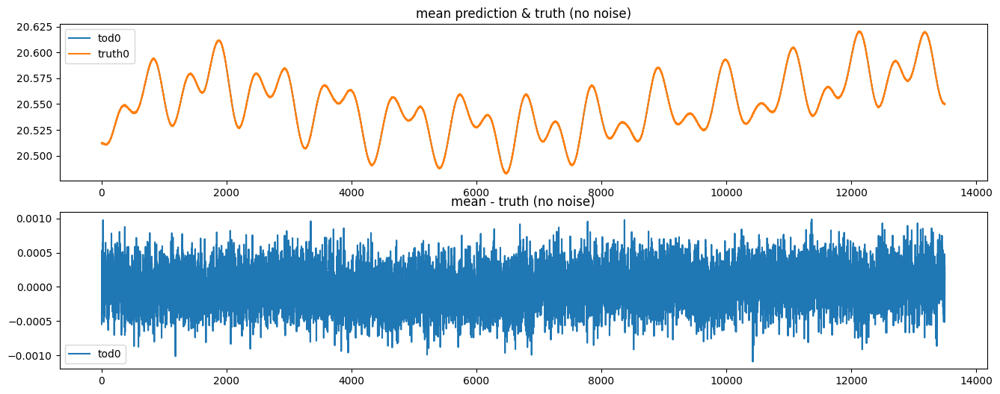

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+7.3690e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.7438e+06 Δ⛰:6.4946e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.9411e+06 Δ⛰:4.8026e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.4406e+06 Δ⛰:1.5006e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.1277e+06 Δ⛰:1.3128e+06 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.3008e+05 Δ⛰:4.9765e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.0849e+05 Δ⛰:3.2159e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.5360e+05 Δ⛰:5.4896e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.7628e+05 Δ⛰:7.7320e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.6333e+05 Δ⛰:1.2946e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2602e+05 Δ⛰:3.7307e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.6671e+04 Δ⛰:2.9354e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+6.3493e+04 Δ⛰:3.3177e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+4.7530e+04 Δ⛰:1.5964e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+4.7142e+04 Δ⛰:3.8749e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+3.9647e+04 Δ⛰:7.4949e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.9402e+04 Δ⛰:2.4550e+02 ➽:1.5503e-01
SL: 

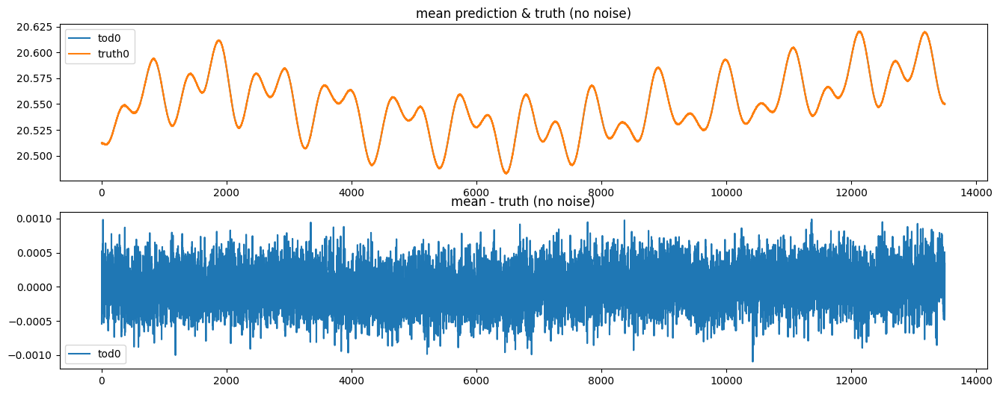

OPTIMIZE_KL: Starting 0012
SL: Iteration 0 ⛰:+1.3395e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.0293e+06 Δ⛰:5.3657e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.9864e+06 Δ⛰:6.0429e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.2352e+06 Δ⛰:7.5114e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+7.7761e+05 Δ⛰:4.5763e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.9778e+05 Δ⛰:7.9831e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.8509e+05 Δ⛰:2.1269e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.0637e+05 Δ⛰:1.7873e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2414e+05 Δ⛰:8.2233e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.8217e+05 Δ⛰:4.1963e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.8182e+05 Δ⛰:3.5221e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.3384e+05 Δ⛰:4.7978e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.6792e+04 Δ⛰:3.7051e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.1723e+04 Δ⛰:2.5069e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.1368e+04 Δ⛰:3.5476e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.6870e+04 Δ⛰:1.4498e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.4025e+04 Δ⛰:1.2845e+04 ➽:1.5503e-01
SL: 

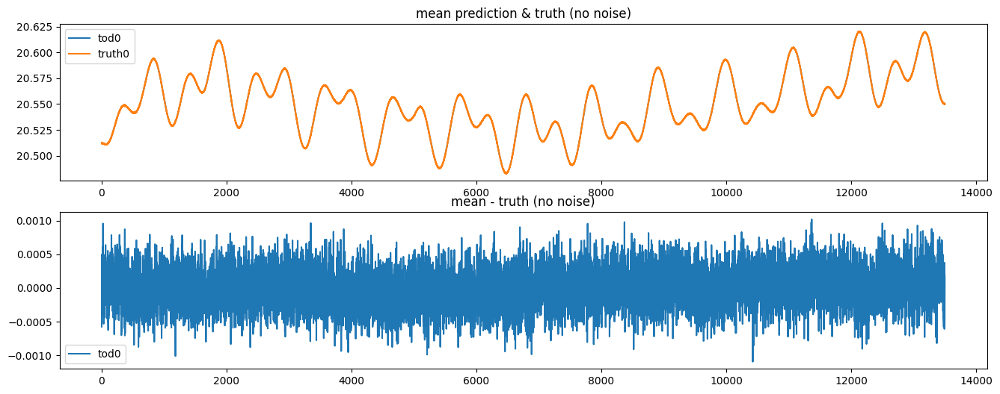

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+1.4920e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.0364e+07 Δ⛰:1.3884e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.6246e+06 Δ⛰:7.7390e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.9903e+06 Δ⛰:6.3429e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.5233e+06 Δ⛰:4.6701e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.0905e+05 Δ⛰:8.1426e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.2607e+05 Δ⛰:2.8298e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.9426e+05 Δ⛰:1.3181e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.4973e+05 Δ⛰:4.4528e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.9656e+05 Δ⛰:5.3171e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.7586e+05 Δ⛰:2.0697e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.1607e+05 Δ⛰:5.9788e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.9117e+04 Δ⛰:1.6957e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.9560e+04 Δ⛰:2.9557e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.3736e+04 Δ⛰:5.8238e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.7636e+04 Δ⛰:1.6100e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.4677e+04 Δ⛰:2.9597e+03 ➽:1.5503e-01
SL: 

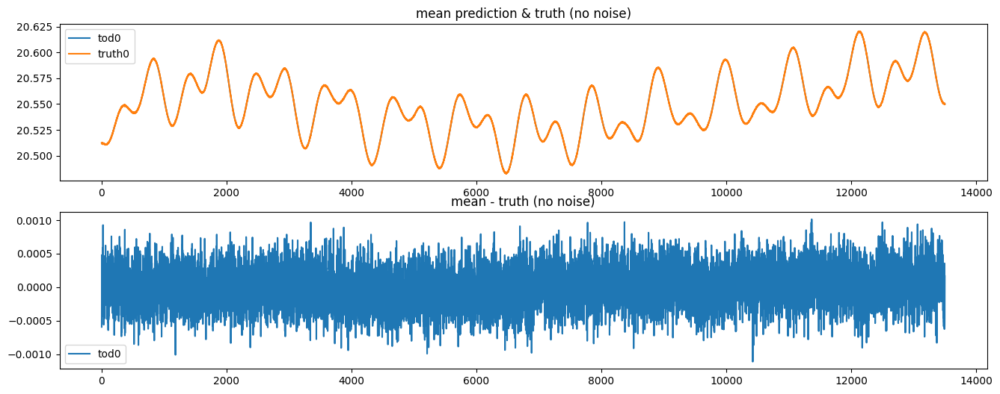

OPTIMIZE_KL: Starting 0014
SL: Iteration 0 ⛰:+2.0359e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+7.6127e+06 Δ⛰:1.9598e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.6928e+06 Δ⛰:4.9198e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.9367e+06 Δ⛰:7.5615e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0775e+06 Δ⛰:8.5916e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+8.6743e+05 Δ⛰:2.1010e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.1705e+05 Δ⛰:4.5038e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.0899e+05 Δ⛰:1.0806e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.3271e+05 Δ⛰:7.6284e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.7772e+05 Δ⛰:5.4985e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.6645e+05 Δ⛰:1.1274e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.3311e+05 Δ⛰:3.3337e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.3794e+04 Δ⛰:3.9318e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.9641e+04 Δ⛰:2.4154e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.9241e+04 Δ⛰:3.9979e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.5891e+04 Δ⛰:1.3349e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.7763e+04 Δ⛰:8.1287e+03 ➽:1.5503e-01
SL: 

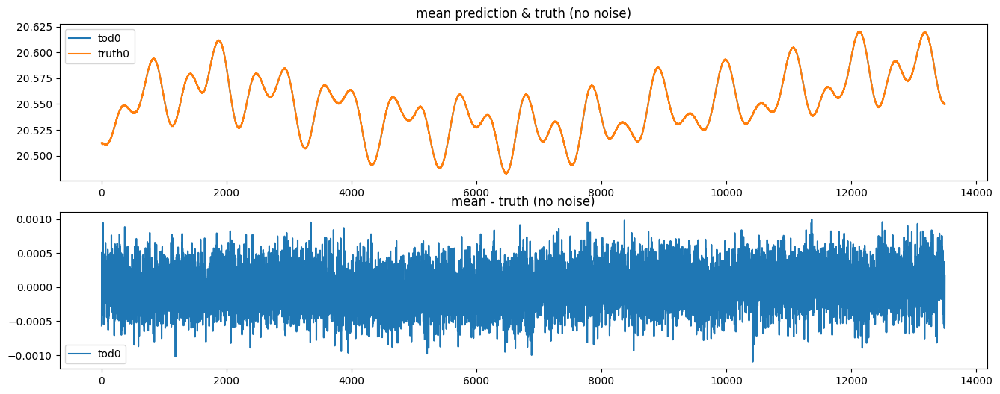

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+1.2277e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.7497e+06 Δ⛰:3.5276e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.3593e+06 Δ⛰:3.3904e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.7694e+06 Δ⛰:2.5899e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.6738e+06 Δ⛰:1.0956e+06 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.2537e+06 Δ⛰:4.2009e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.3247e+05 Δ⛰:7.2124e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.4742e+05 Δ⛰:1.8506e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2024e+05 Δ⛰:1.2718e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.8174e+05 Δ⛰:3.8502e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.7631e+05 Δ⛰:5.4304e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.1792e+05 Δ⛰:5.8390e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.7273e+04 Δ⛰:2.0648e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.7849e+04 Δ⛰:2.9424e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.7562e+04 Δ⛰:2.8723e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.7100e+04 Δ⛰:2.0461e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.4755e+04 Δ⛰:2.3459e+03 ➽:1.5503e-01
SL: 

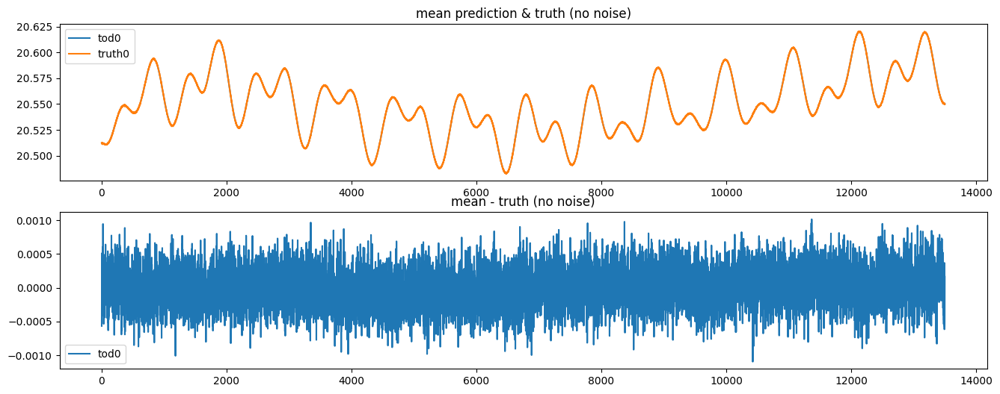

OPTIMIZE_KL: Starting 0016
SL: Iteration 0 ⛰:+5.6520e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.7213e+07 Δ⛰:3.9307e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.0343e+06 Δ⛰:1.5179e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+9.9372e+05 Δ⛰:1.0406e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+5.8869e+05 Δ⛰:4.0503e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+4.3286e+05 Δ⛰:1.5583e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.5719e+05 Δ⛰:7.5667e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.6087e+05 Δ⛰:9.6319e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.6782e+05 Δ⛰:9.3053e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.2963e+05 Δ⛰:3.8189e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2665e+05 Δ⛰:2.9768e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.0198e+05 Δ⛰:2.4672e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.1229e+04 Δ⛰:2.0753e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.1314e+04 Δ⛰:1.9915e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.0807e+04 Δ⛰:5.0719e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.8199e+04 Δ⛰:1.2607e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.7402e+04 Δ⛰:7.9766e+02 ➽:1.5503e-01
SL: 

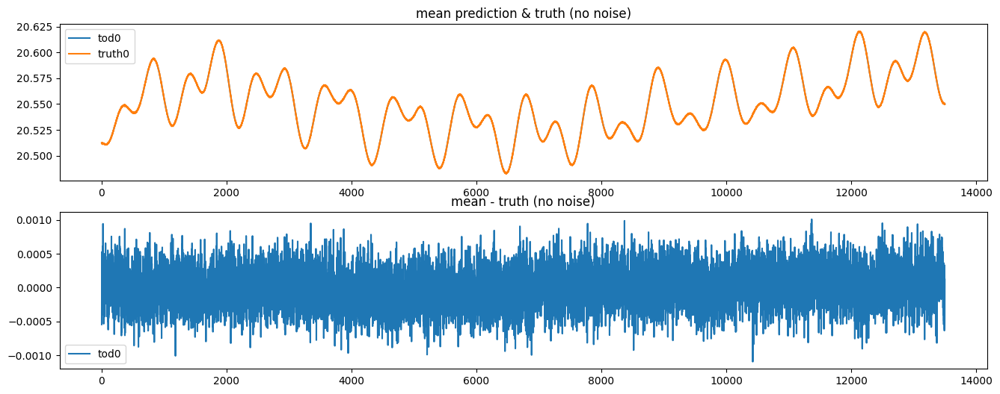

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+7.6110e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+2.9582e+07 Δ⛰:4.6528e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.9322e+06 Δ⛰:2.6650e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.6776e+06 Δ⛰:1.2546e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.2269e+06 Δ⛰:4.5069e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+4.1961e+05 Δ⛰:8.0728e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.4859e+05 Δ⛰:1.7101e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+1.6882e+05 Δ⛰:7.9767e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.3996e+05 Δ⛰:2.8861e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.1639e+05 Δ⛰:2.3577e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.1617e+05 Δ⛰:2.1610e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+8.4783e+04 Δ⛰:3.1388e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+7.5414e+04 Δ⛰:9.3688e+03 ➽:1.5503e-01
SL: Iteration 13 ⛰:+5.8339e+04 Δ⛰:1.7075e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.3888e+04 Δ⛰:4.4512e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.2921e+04 Δ⛰:1.0967e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.4807e+04 Δ⛰:8.1141e+03 ➽:1.5503e-01
SL: 

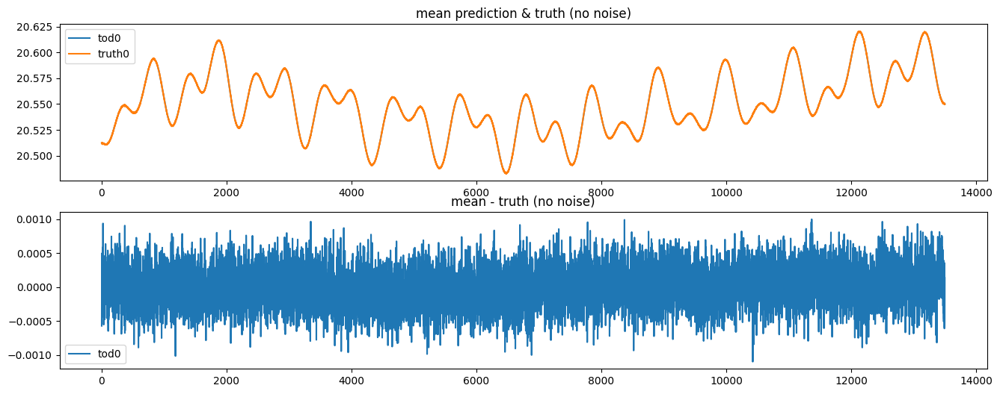

OPTIMIZE_KL: Starting 0018
SL: Iteration 0 ⛰:+2.0277e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+5.5094e+06 Δ⛰:1.4768e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.8242e+06 Δ⛰:2.6852e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.5028e+06 Δ⛰:1.3214e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0625e+06 Δ⛰:4.4027e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+9.7879e+05 Δ⛰:8.3759e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+6.7413e+05 Δ⛰:3.0466e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.6385e+05 Δ⛰:1.1028e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0191e+05 Δ⛰:2.6195e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.7942e+05 Δ⛰:1.2249e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.5656e+05 Δ⛰:2.2860e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.1725e+05 Δ⛰:3.9309e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.6095e+04 Δ⛰:2.1151e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.5997e+04 Δ⛰:3.0098e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.5386e+04 Δ⛰:6.1054e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.5481e+04 Δ⛰:1.9906e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.6327e+04 Δ⛰:9.1537e+03 ➽:1.5503e-01
SL: 

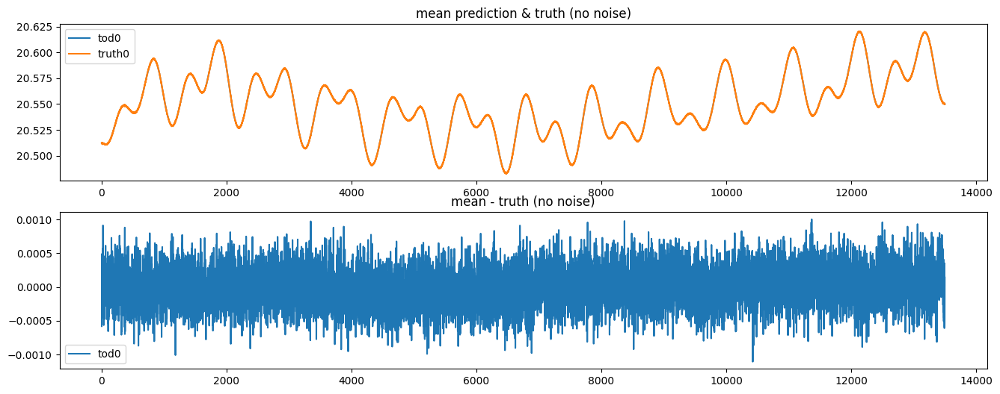

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+4.5379e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.4262e+06 Δ⛰:3.6953e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.0798e+06 Δ⛰:5.3464e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.7102e+06 Δ⛰:1.3696e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0958e+06 Δ⛰:6.1440e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.7228e+05 Δ⛰:4.2348e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.0300e+05 Δ⛰:1.6928e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.8377e+05 Δ⛰:2.1923e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.0671e+05 Δ⛰:7.7061e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.5779e+05 Δ⛰:4.8917e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.5727e+05 Δ⛰:5.2180e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+8.7597e+04 Δ⛰:6.9676e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+6.2103e+04 Δ⛰:2.5494e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+4.8474e+04 Δ⛰:1.3629e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+4.8271e+04 Δ⛰:2.0309e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+3.7838e+04 Δ⛰:1.0433e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.7684e+04 Δ⛰:1.5429e+02 ➽:1.5503e-01
SL: 

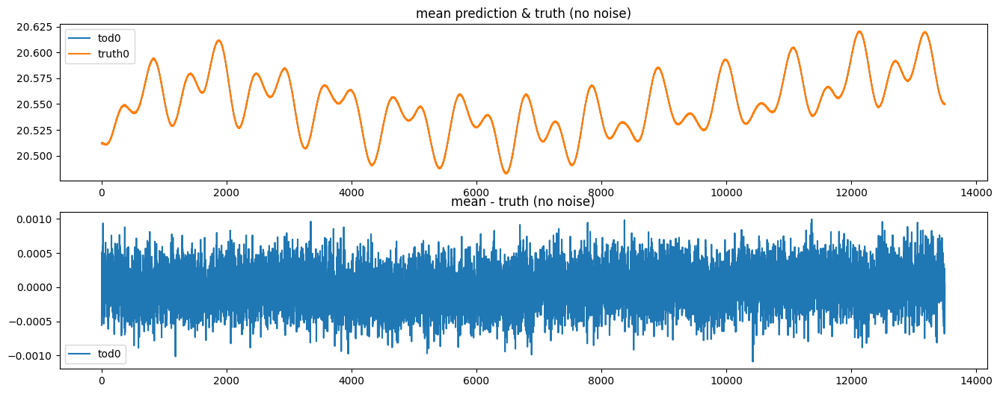

OPTIMIZE_KL: Starting 0020
SL: Iteration 0 ⛰:+3.5891e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.7756e+07 Δ⛰:1.8135e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.5315e+06 Δ⛰:1.3224e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.4323e+06 Δ⛰:3.0992e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+6.2257e+05 Δ⛰:8.0975e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+5.6301e+05 Δ⛰:5.9559e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.2724e+05 Δ⛰:1.3577e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.5264e+05 Δ⛰:1.7460e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.7536e+05 Δ⛰:7.7278e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.3726e+05 Δ⛰:3.8099e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.3705e+05 Δ⛰:2.1056e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.0464e+05 Δ⛰:3.2415e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.1014e+04 Δ⛰:1.3625e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.4095e+04 Δ⛰:1.6919e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.3289e+04 Δ⛰:8.0588e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.2941e+04 Δ⛰:2.0349e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.7412e+04 Δ⛰:1.5529e+04 ➽:1.5503e-01
SL: 

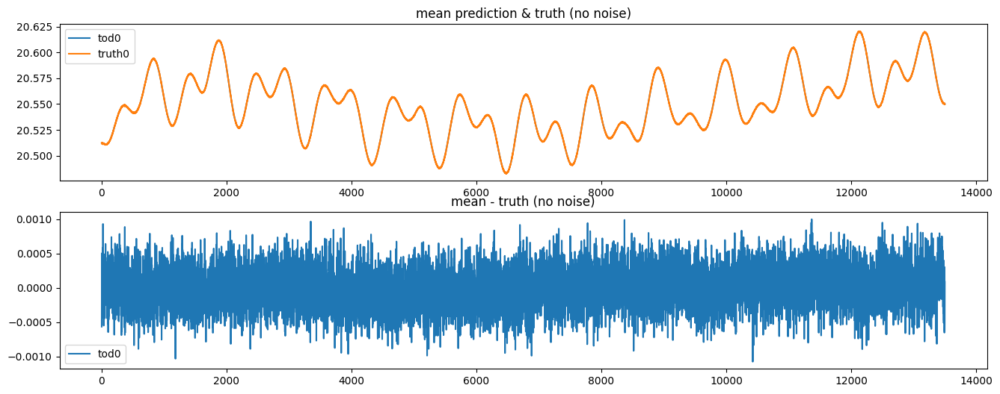

OPTIMIZE_KL: Starting 0021
SL: Iteration 0 ⛰:+4.2486e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.9715e+07 Δ⛰:2.2771e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.6051e+06 Δ⛰:1.4110e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.1006e+06 Δ⛰:3.5044e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.3138e+06 Δ⛰:7.8677e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1298e+06 Δ⛰:1.8402e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.3488e+05 Δ⛰:5.9494e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.7462e+05 Δ⛰:1.6027e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.3660e+05 Δ⛰:1.3802e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.5993e+05 Δ⛰:7.6669e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.5946e+05 Δ⛰:4.7340e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.2343e+05 Δ⛰:3.6020e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.9223e+04 Δ⛰:2.4212e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.1428e+04 Δ⛰:3.7795e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.1048e+04 Δ⛰:3.8040e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.1181e+04 Δ⛰:9.8672e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.7694e+04 Δ⛰:1.3487e+04 ➽:1.5503e-01
SL: 

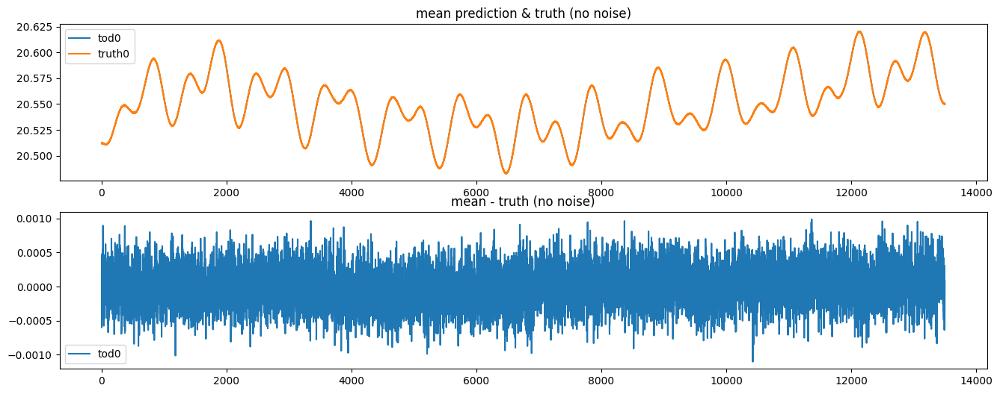

OPTIMIZE_KL: Starting 0022
SL: Iteration 0 ⛰:+7.4582e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.1330e+06 Δ⛰:7.1449e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.9785e+06 Δ⛰:1.1545e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.5418e+06 Δ⛰:4.3674e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.3536e+06 Δ⛰:1.8815e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.7828e+05 Δ⛰:5.7532e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.6552e+05 Δ⛰:2.1276e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.0614e+05 Δ⛰:1.5937e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.1874e+05 Δ⛰:8.7400e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.4548e+05 Δ⛰:7.3267e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.4187e+05 Δ⛰:3.6011e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.9441e+05 Δ⛰:4.7466e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.4252e+05 Δ⛰:5.1886e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+1.2044e+05 Δ⛰:2.2083e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+9.0935e+04 Δ⛰:2.9505e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+9.0547e+04 Δ⛰:3.8797e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.2873e+04 Δ⛰:2.7674e+04 ➽:1.5503e-01
SL: 

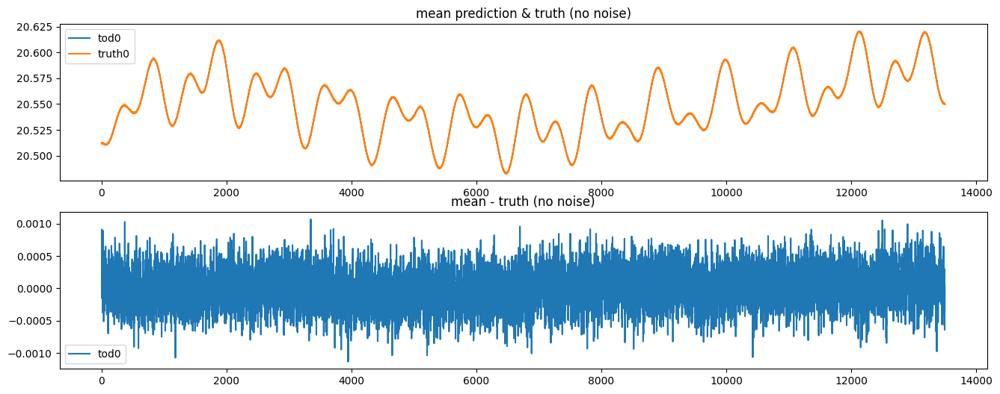

OPTIMIZE_KL: Starting 0023
SL: Iteration 0 ⛰:+2.3899e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+5.6120e+06 Δ⛰:1.8287e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.0942e+06 Δ⛰:2.5179e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+9.5124e+05 Δ⛰:2.1429e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+4.0308e+05 Δ⛰:5.4816e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+3.3216e+05 Δ⛰:7.0925e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.5398e+05 Δ⛰:7.8175e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.0108e+05 Δ⛰:5.2897e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.7211e+05 Δ⛰:2.8974e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.3131e+05 Δ⛰:4.0798e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.2991e+05 Δ⛰:1.3983e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.0050e+04 Δ⛰:3.9864e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+7.3663e+04 Δ⛰:1.6387e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.0208e+04 Δ⛰:1.3455e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.4105e+04 Δ⛰:6.1035e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.9487e+04 Δ⛰:4.6179e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.4714e+04 Δ⛰:4.7728e+03 ➽:1.5503e-01
SL: 

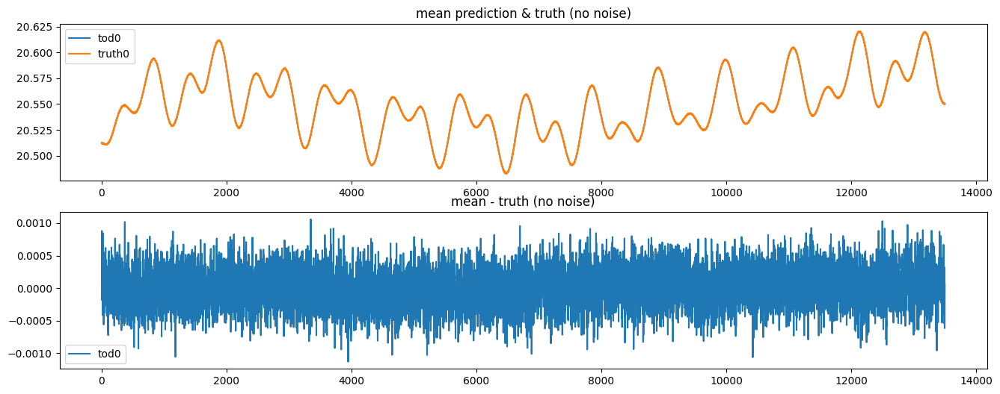

OPTIMIZE_KL: Starting 0024
SL: Iteration 0 ⛰:+7.6592e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.3480e+07 Δ⛰:6.3113e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.7512e+06 Δ⛰:8.7283e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.0601e+06 Δ⛰:3.6911e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+6.3599e+05 Δ⛰:4.2415e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+4.2823e+05 Δ⛰:2.0776e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.5595e+05 Δ⛰:7.2280e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.9366e+05 Δ⛰:6.2284e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.9568e+05 Δ⛰:9.7983e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4479e+05 Δ⛰:5.0890e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4340e+05 Δ⛰:1.3897e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.1568e+05 Δ⛰:2.7718e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.6582e+04 Δ⛰:1.9100e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.3403e+04 Δ⛰:1.3180e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+8.2373e+04 Δ⛰:1.0299e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.5882e+04 Δ⛰:1.6491e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.1468e+04 Δ⛰:1.4414e+04 ➽:1.5503e-01
SL: 

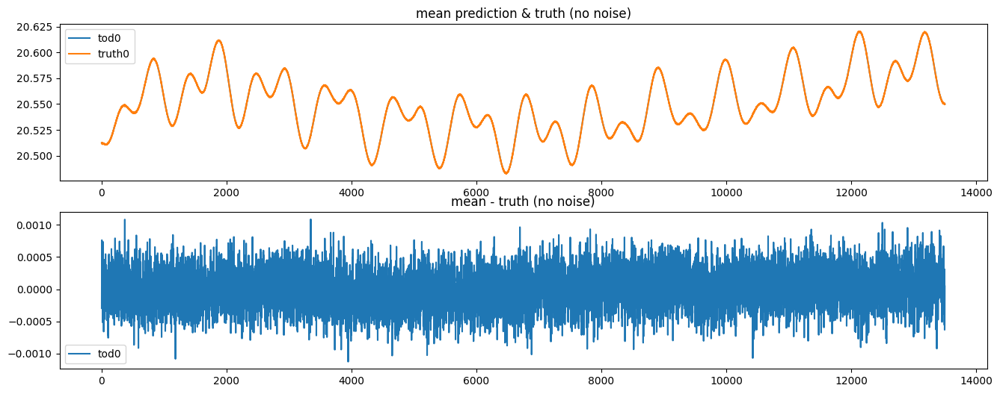

OPTIMIZE_KL: Starting 0025
SL: Iteration 0 ⛰:+8.1672e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.7940e+07 Δ⛰:6.3732e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.8333e+06 Δ⛰:1.6107e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.2031e+06 Δ⛰:6.3018e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+9.4245e+05 Δ⛰:2.6067e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.2210e+05 Δ⛰:2.2035e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.9585e+05 Δ⛰:2.2625e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.0113e+05 Δ⛰:9.4720e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0822e+05 Δ⛰:9.2905e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.4395e+05 Δ⛰:6.4276e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.3926e+05 Δ⛰:4.6871e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.7707e+05 Δ⛰:6.2190e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2514e+05 Δ⛰:5.1926e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.9425e+04 Δ⛰:2.5719e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.8122e+04 Δ⛰:2.1303e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+7.5307e+04 Δ⛰:2.8153e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.9122e+04 Δ⛰:6.1843e+03 ➽:1.5503e-01
SL: 

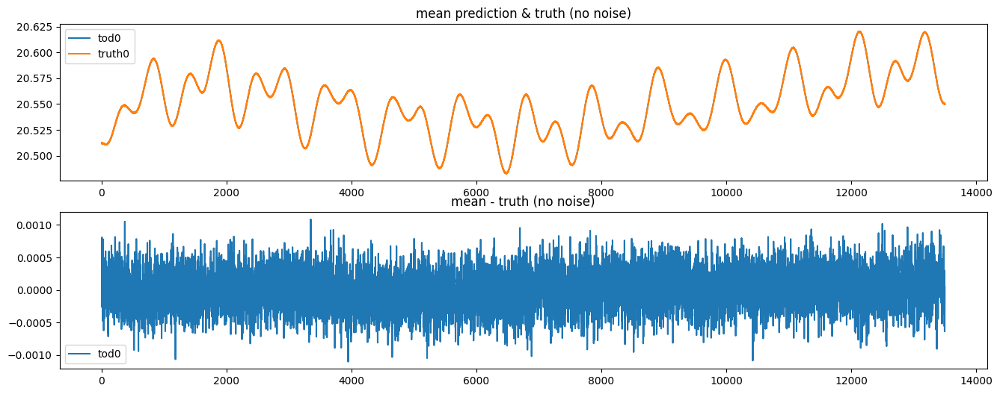

OPTIMIZE_KL: Starting 0026
SL: Iteration 0 ⛰:+1.3371e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.0543e+06 Δ⛰:2.8279e+05 ➽:1.5503e-01
SL: Iteration 2 ⛰:+8.8980e+05 Δ⛰:1.6454e+05 ➽:1.5503e-01
SL: Iteration 3 ⛰:+7.4484e+05 Δ⛰:1.4496e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+6.7089e+05 Δ⛰:7.3948e+04 ➽:1.5503e-01
SL: Iteration 5 ⛰:+5.7364e+05 Δ⛰:9.7253e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.1107e+05 Δ⛰:1.6257e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.7841e+05 Δ⛰:1.3267e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.1887e+05 Δ⛰:5.9533e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.7581e+05 Δ⛰:4.3064e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4542e+05 Δ⛰:3.0392e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4515e+05 Δ⛰:2.6883e+02 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2216e+05 Δ⛰:2.2989e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.8148e+04 Δ⛰:2.4010e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.5183e+04 Δ⛰:3.2965e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.5000e+04 Δ⛰:1.8315e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.9320e+04 Δ⛰:5.6802e+03 ➽:1.5503e-01
SL: 

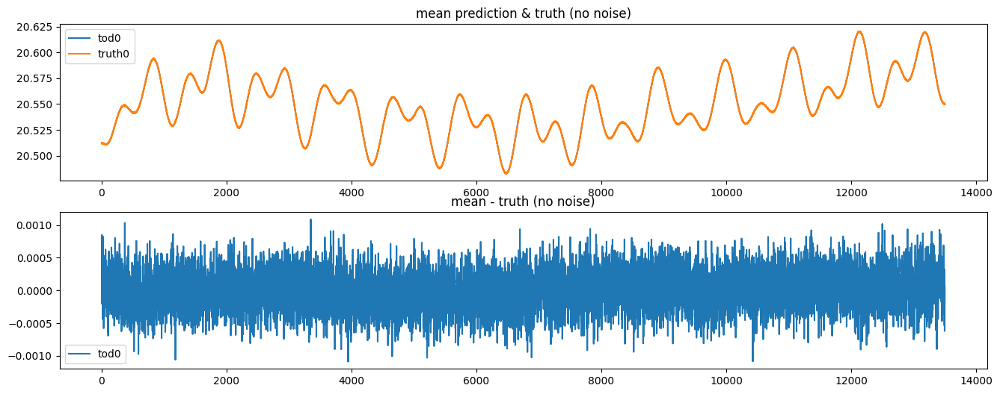

OPTIMIZE_KL: Starting 0027
SL: Iteration 0 ⛰:+8.4607e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+6.9773e+06 Δ⛰:1.4834e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.5235e+06 Δ⛰:2.4538e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.8452e+06 Δ⛰:2.6783e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0951e+06 Δ⛰:7.5014e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.9414e+05 Δ⛰:3.0093e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.6143e+05 Δ⛰:3.3272e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.3831e+05 Δ⛰:1.2311e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2683e+05 Δ⛰:1.1148e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.8599e+05 Δ⛰:4.0837e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.7765e+05 Δ⛰:8.3447e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4930e+05 Δ⛰:2.8347e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.4643e+04 Δ⛰:5.4659e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.9498e+04 Δ⛰:1.5145e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.4168e+04 Δ⛰:5.3303e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.7700e+04 Δ⛰:1.6468e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.6416e+04 Δ⛰:1.1283e+04 ➽:1.5503e-01
SL: 

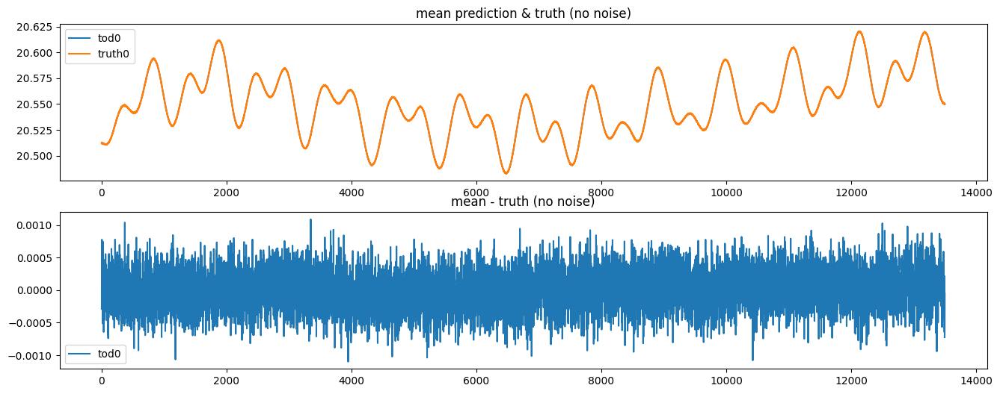

OPTIMIZE_KL: Starting 0028
SL: Iteration 0 ⛰:+3.0994e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+5.4426e+06 Δ⛰:2.5551e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+1.7736e+06 Δ⛰:3.6690e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.0222e+06 Δ⛰:7.5135e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+6.5568e+05 Δ⛰:3.6657e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+4.6101e+05 Δ⛰:1.9467e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.2201e+05 Δ⛰:1.3900e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.6324e+05 Δ⛰:5.8764e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2016e+05 Δ⛰:4.3082e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.5101e+05 Δ⛰:6.9147e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4983e+05 Δ⛰:1.1842e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.0902e+05 Δ⛰:4.0808e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.0708e+04 Δ⛰:1.8313e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.3403e+04 Δ⛰:2.7305e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.0344e+04 Δ⛰:3.0590e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.5981e+04 Δ⛰:1.4364e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.3032e+04 Δ⛰:2.9481e+03 ➽:1.5503e-01
SL: 

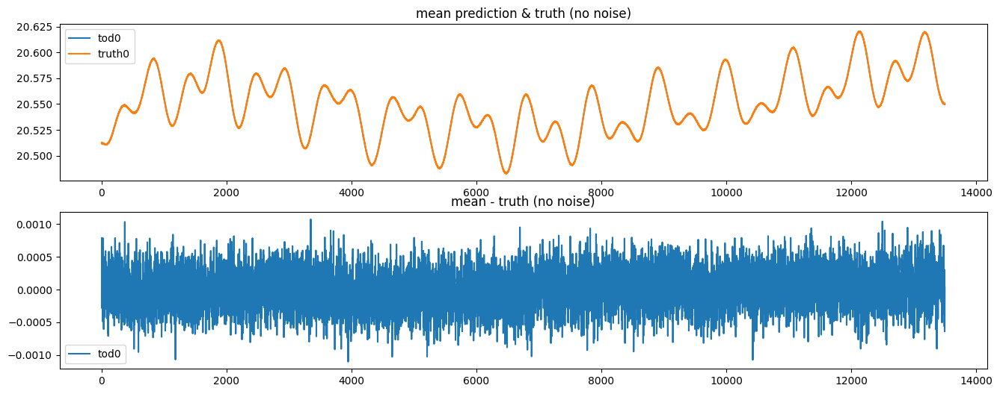

OPTIMIZE_KL: Starting 0029
SL: Iteration 0 ⛰:+2.8247e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.3420e+07 Δ⛰:1.4827e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.4217e+06 Δ⛰:8.9980e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.8305e+06 Δ⛰:1.5912e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.3192e+06 Δ⛰:5.1125e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.4623e+06 Δ⛰:8.5693e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+8.5060e+05 Δ⛰:6.1172e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.3444e+05 Δ⛰:3.1616e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0571e+05 Δ⛰:2.2873e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.5276e+05 Δ⛰:5.2951e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.4476e+05 Δ⛰:7.9968e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.7813e+05 Δ⛰:6.6629e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2500e+05 Δ⛰:5.3134e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.8520e+04 Δ⛰:4.6476e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.7772e+04 Δ⛰:7.4816e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.8163e+04 Δ⛰:2.9609e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.2674e+04 Δ⛰:5.4880e+03 ➽:1.5503e-01
SL: 

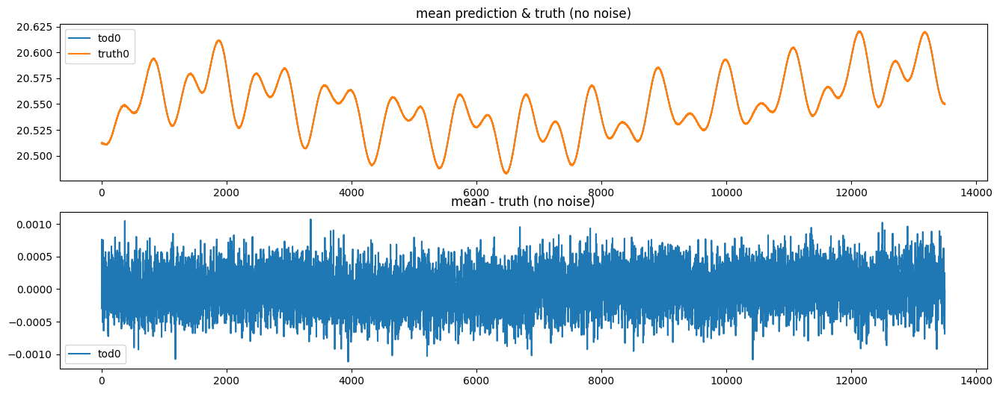

OPTIMIZE_KL: Starting 0030
SL: Iteration 0 ⛰:+3.6061e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.7742e+07 Δ⛰:1.8318e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+6.2076e+06 Δ⛰:1.1535e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.4067e+06 Δ⛰:3.8009e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.4384e+06 Δ⛰:9.6828e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+9.4378e+05 Δ⛰:4.9467e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.8367e+05 Δ⛰:3.6011e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.3106e+05 Δ⛰:1.5261e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0208e+05 Δ⛰:1.2898e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.9889e+05 Δ⛰:1.0319e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.9764e+05 Δ⛰:1.2538e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.5373e+05 Δ⛰:4.3912e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.1354e+05 Δ⛰:4.0184e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.3952e+04 Δ⛰:1.9590e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+9.0839e+04 Δ⛰:3.1130e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+7.3918e+04 Δ⛰:1.6921e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.1252e+04 Δ⛰:2.2666e+04 ➽:1.5503e-01
SL: 

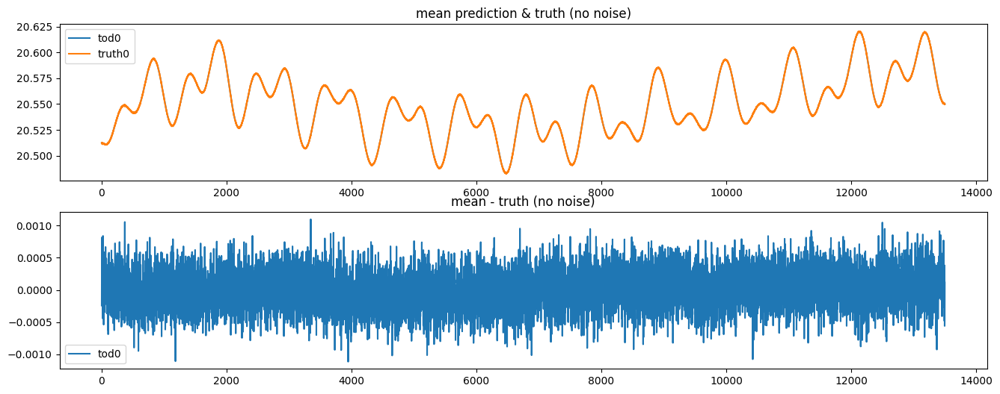

OPTIMIZE_KL: Starting 0031
SL: Iteration 0 ⛰:+7.4579e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.0955e+07 Δ⛰:6.3624e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.2575e+06 Δ⛰:5.6977e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+3.1856e+06 Δ⛰:2.0720e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.1746e+06 Δ⛰:1.0110e+06 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.3398e+06 Δ⛰:8.3478e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+6.9179e+05 Δ⛰:6.4804e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.7215e+05 Δ⛰:1.1965e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.8269e+05 Δ⛰:1.8946e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.0927e+05 Δ⛰:1.7342e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.0793e+05 Δ⛰:1.3434e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4507e+05 Δ⛰:6.2856e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.2831e+04 Δ⛰:6.2242e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.6912e+04 Δ⛰:1.5918e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.3595e+04 Δ⛰:1.3317e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.2303e+04 Δ⛰:1.2918e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.1792e+04 Δ⛰:5.1063e+02 ➽:1.5503e-01
SL: 

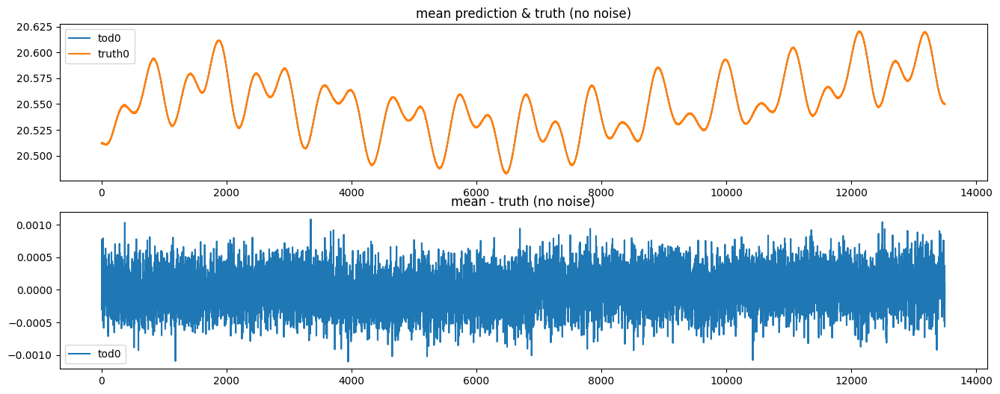

OPTIMIZE_KL: Starting 0032
SL: Iteration 0 ⛰:+1.7779e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.5284e+07 Δ⛰:1.4251e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+6.9339e+06 Δ⛰:2.8350e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.9085e+06 Δ⛰:5.0254e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0332e+06 Δ⛰:8.7528e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.2405e+05 Δ⛰:3.0917e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+2.8106e+05 Δ⛰:4.4298e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.4284e+05 Δ⛰:3.8227e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.4222e+05 Δ⛰:1.0061e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.1534e+05 Δ⛰:2.6885e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.1363e+05 Δ⛰:1.7147e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.0037e+05 Δ⛰:1.3257e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+8.5438e+04 Δ⛰:1.4929e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.5436e+04 Δ⛰:2.0003e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.5046e+04 Δ⛰:3.9006e+02 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.7897e+04 Δ⛰:7.1485e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.2623e+04 Δ⛰:5.2748e+03 ➽:1.5503e-01
SL: 

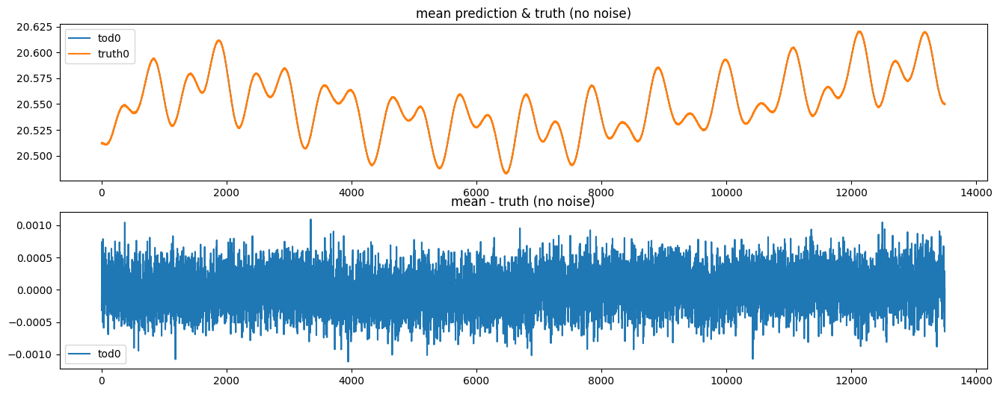

OPTIMIZE_KL: Starting 0033
SL: Iteration 0 ⛰:+1.9055e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.0650e+07 Δ⛰:8.4054e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.3157e+06 Δ⛰:7.3342e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.4444e+06 Δ⛰:1.8714e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.1685e+06 Δ⛰:2.7583e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+7.8146e+05 Δ⛰:3.8706e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.9096e+05 Δ⛰:2.9051e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.5874e+05 Δ⛰:1.3221e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2070e+05 Δ⛰:1.3805e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4520e+05 Δ⛰:7.5499e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4450e+05 Δ⛰:7.0145e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.2432e+05 Δ⛰:2.0174e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+7.9669e+04 Δ⛰:4.4655e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+6.0602e+04 Δ⛰:1.9067e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+4.7670e+04 Δ⛰:1.2932e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+4.3339e+04 Δ⛰:4.3305e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+4.2034e+04 Δ⛰:1.3057e+03 ➽:1.5503e-01
SL: 

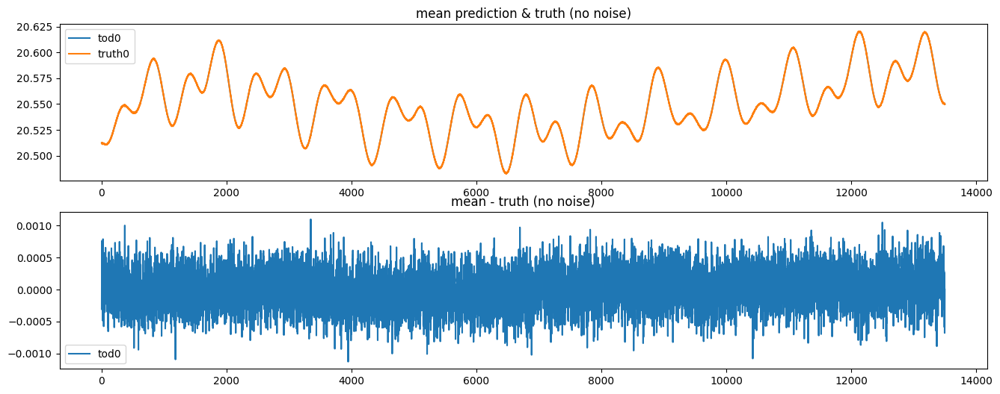

OPTIMIZE_KL: Starting 0034
SL: Iteration 0 ⛰:+1.8102e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.0181e+07 Δ⛰:7.9209e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.9920e+06 Δ⛰:5.1895e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+3.5623e+06 Δ⛰:1.4297e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.3273e+06 Δ⛰:1.2351e+06 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.4291e+06 Δ⛰:8.9818e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+8.5335e+05 Δ⛰:5.7575e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.1143e+05 Δ⛰:3.4192e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.6293e+05 Δ⛰:1.4850e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.7466e+05 Δ⛰:8.8269e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.5380e+05 Δ⛰:2.0853e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+2.0223e+05 Δ⛰:5.1576e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2387e+05 Δ⛰:7.8358e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.8999e+04 Δ⛰:3.4871e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.4980e+04 Δ⛰:2.4019e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.3686e+04 Δ⛰:1.2945e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.1345e+04 Δ⛰:2.3408e+03 ➽:1.5503e-01
SL: 

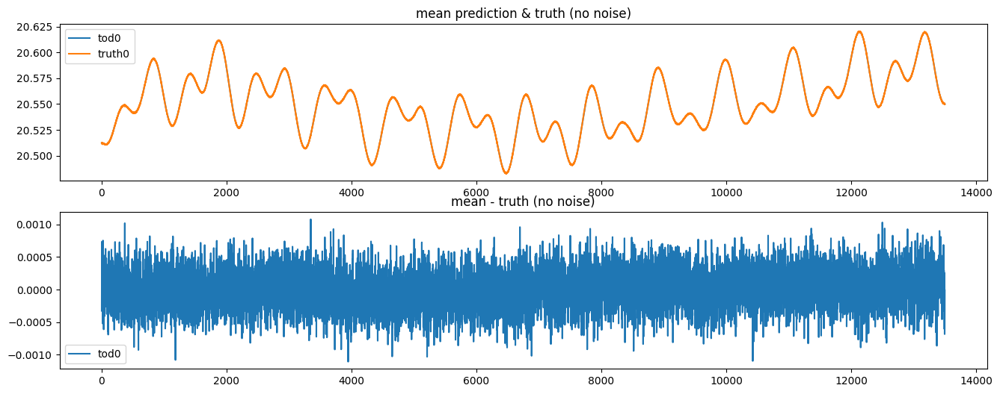

OPTIMIZE_KL: Starting 0035
SL: Iteration 0 ⛰:+5.5348e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+7.4530e+06 Δ⛰:4.7895e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.2631e+06 Δ⛰:3.1899e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+9.8917e+05 Δ⛰:3.2739e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+5.4399e+05 Δ⛰:4.4518e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+4.2416e+05 Δ⛰:1.1982e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.4425e+05 Δ⛰:7.9909e+04 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.8925e+05 Δ⛰:5.5009e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+1.9069e+05 Δ⛰:9.8554e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.4659e+05 Δ⛰:4.4102e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.4627e+05 Δ⛰:3.2544e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+9.0088e+04 Δ⛰:5.6177e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+7.4040e+04 Δ⛰:1.6048e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+5.9925e+04 Δ⛰:1.4115e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.2090e+04 Δ⛰:7.8343e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.0917e+04 Δ⛰:1.1730e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+3.8701e+04 Δ⛰:1.2217e+04 ➽:1.5503e-01
SL: 

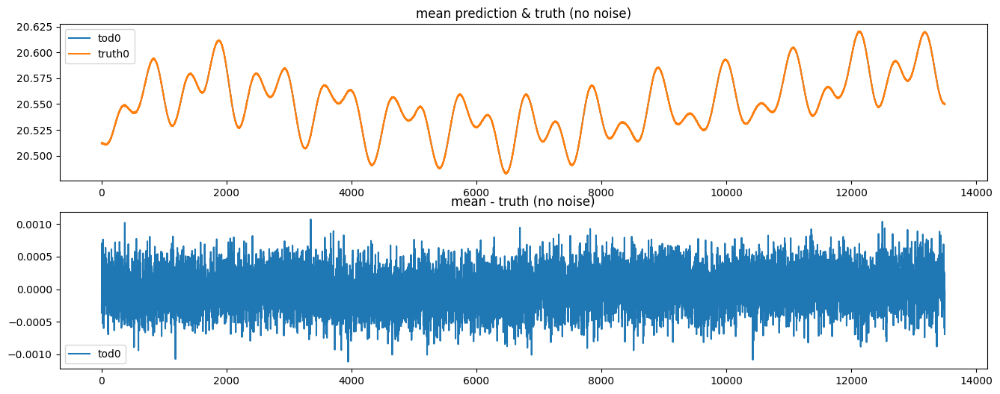

OPTIMIZE_KL: Starting 0036
SL: Iteration 0 ⛰:+1.7384e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+5.0178e+06 Δ⛰:1.6882e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.4114e+06 Δ⛰:2.6064e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.6298e+06 Δ⛰:7.8159e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.3309e+06 Δ⛰:2.9887e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+5.6822e+05 Δ⛰:7.6273e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.2434e+05 Δ⛰:1.4388e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.4046e+05 Δ⛰:8.3881e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.8360e+05 Δ⛰:5.6864e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.3292e+05 Δ⛰:5.0673e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.3172e+05 Δ⛰:1.2004e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.6976e+05 Δ⛰:6.1963e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2609e+05 Δ⛰:4.3669e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+1.0271e+05 Δ⛰:2.3380e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.1204e+04 Δ⛰:3.1507e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.9684e+04 Δ⛰:1.5205e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.5505e+04 Δ⛰:1.4179e+04 ➽:1.5503e-01
SL: 

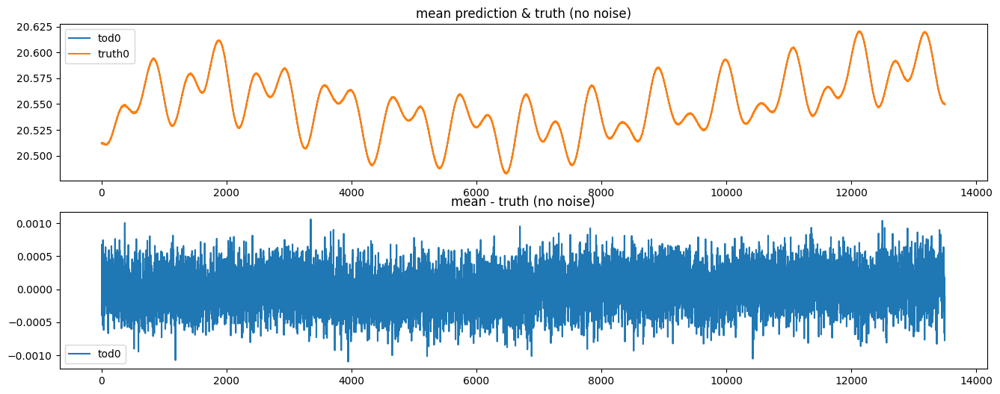

OPTIMIZE_KL: Starting 0037
SL: Iteration 0 ⛰:+6.4638e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.8307e+07 Δ⛰:4.6331e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.0767e+06 Δ⛰:1.5230e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.2862e+06 Δ⛰:7.9049e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.8573e+06 Δ⛰:4.2895e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1064e+06 Δ⛰:7.5087e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+6.7149e+05 Δ⛰:4.3490e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.3044e+05 Δ⛰:1.4105e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+4.3201e+05 Δ⛰:9.8430e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.1943e+05 Δ⛰:2.1258e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.6476e+05 Δ⛰:5.4671e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.5964e+05 Δ⛰:5.1114e+03 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.1339e+05 Δ⛰:4.6258e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.8297e+04 Δ⛰:2.5089e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.8964e+04 Δ⛰:9.3332e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+7.5268e+04 Δ⛰:3.6961e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+7.4088e+04 Δ⛰:1.1805e+03 ➽:1.5503e-01
SL: 

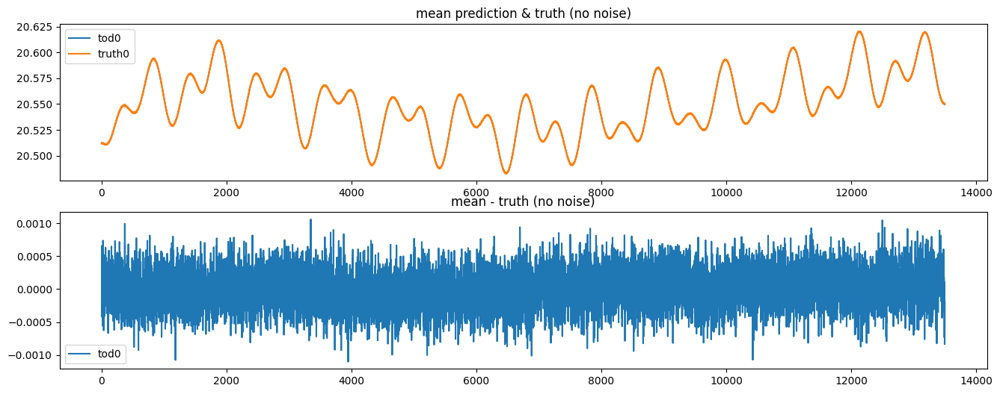

OPTIMIZE_KL: Starting 0038
SL: Iteration 0 ⛰:+1.0741e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.2964e+07 Δ⛰:9.4441e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.8051e+06 Δ⛰:7.1589e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.1694e+06 Δ⛰:3.6357e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.6545e+06 Δ⛰:5.1496e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.3249e+06 Δ⛰:3.2957e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.0665e+05 Δ⛰:9.1825e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.5155e+05 Δ⛰:5.5105e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.2899e+05 Δ⛰:1.2255e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.8823e+05 Δ⛰:4.0770e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.8735e+05 Δ⛰:8.7543e+02 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4655e+05 Δ⛰:4.0804e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2653e+05 Δ⛰:2.0021e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.3278e+04 Δ⛰:4.3247e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.4875e+04 Δ⛰:1.8403e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.4684e+04 Δ⛰:1.9038e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.1815e+04 Δ⛰:2.8692e+03 ➽:1.5503e-01
SL: 

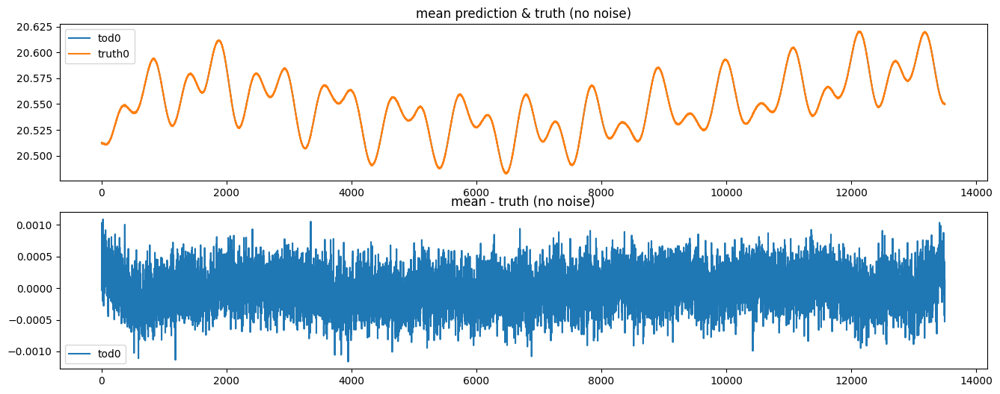

OPTIMIZE_KL: Starting 0039
SL: Iteration 0 ⛰:+1.2145e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.9473e+06 Δ⛰:3.1975e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.7276e+06 Δ⛰:3.2197e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.7679e+06 Δ⛰:2.9597e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.1056e+06 Δ⛰:6.6227e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.0582e+06 Δ⛰:1.0474e+06 ➽:1.5503e-01
SL: Iteration 6 ⛰:+8.5456e+05 Δ⛰:2.0362e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.8212e+05 Δ⛰:2.7244e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.6990e+05 Δ⛰:2.1222e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.3420e+05 Δ⛰:1.3570e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.5210e+05 Δ⛰:8.2091e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4408e+05 Δ⛰:8.0202e+03 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.0629e+05 Δ⛰:3.7793e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.5073e+04 Δ⛰:1.1219e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.7891e+04 Δ⛰:2.7181e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.7426e+04 Δ⛰:4.6515e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.4265e+04 Δ⛰:3.1615e+03 ➽:1.5503e-01
SL: 

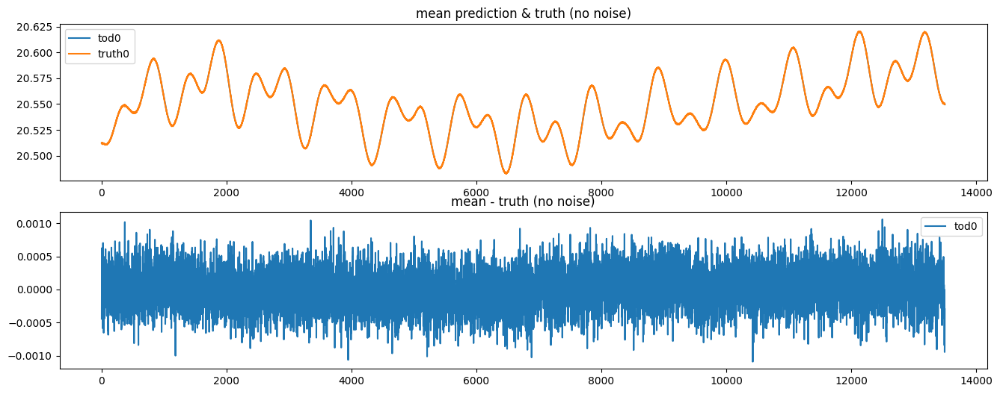

OPTIMIZE_KL: Starting 0040
SL: Iteration 0 ⛰:+2.4331e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.2134e+06 Δ⛰:1.6117e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.3213e+06 Δ⛰:5.8921e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.5457e+06 Δ⛰:7.7567e+05 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.2712e+06 Δ⛰:2.7450e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.0264e+06 Δ⛰:2.4473e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+7.0335e+05 Δ⛰:3.2309e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+5.3640e+05 Δ⛰:1.6694e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+4.4461e+05 Δ⛰:9.1792e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.3282e+05 Δ⛰:2.1179e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.2125e+05 Δ⛰:1.1568e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.7309e+05 Δ⛰:4.8163e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2088e+05 Δ⛰:5.2211e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+1.0085e+05 Δ⛰:2.0032e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+8.3262e+04 Δ⛰:1.7585e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+8.0824e+04 Δ⛰:2.4384e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+8.0153e+04 Δ⛰:6.7110e+02 ➽:1.5503e-01
SL: 

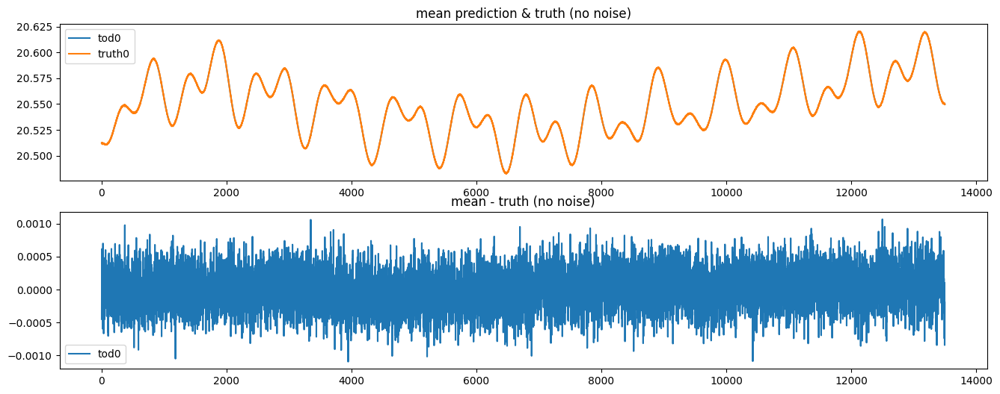

OPTIMIZE_KL: Starting 0041
SL: Iteration 0 ⛰:+9.7712e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+6.8759e+06 Δ⛰:2.8953e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.9424e+06 Δ⛰:2.9335e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.3475e+06 Δ⛰:1.5949e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.6366e+06 Δ⛰:7.1093e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1416e+06 Δ⛰:4.9494e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+7.0363e+05 Δ⛰:4.3799e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.9619e+05 Δ⛰:2.0744e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.7192e+05 Δ⛰:1.2427e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.0089e+05 Δ⛰:1.7103e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.6710e+05 Δ⛰:3.3794e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.4634e+05 Δ⛰:2.0762e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.1821e+05 Δ⛰:2.8123e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.9771e+04 Δ⛰:2.8442e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.0827e+04 Δ⛰:1.8945e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+7.0585e+04 Δ⛰:2.4139e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.9294e+04 Δ⛰:1.1291e+04 ➽:1.5503e-01
SL: 

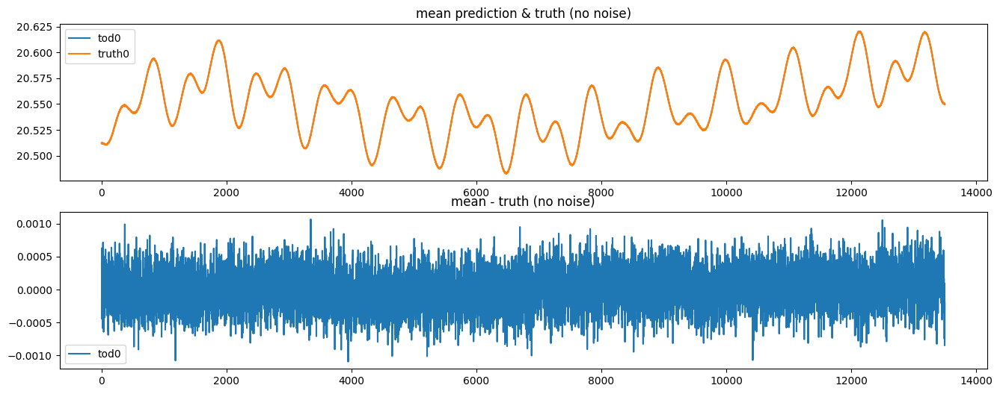

OPTIMIZE_KL: Starting 0042
SL: Iteration 0 ⛰:+3.2028e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.7878e+07 Δ⛰:1.4150e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.2745e+06 Δ⛰:1.2604e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.6801e+06 Δ⛰:2.5944e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.8459e+06 Δ⛰:8.3417e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+9.6396e+05 Δ⛰:8.8197e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+6.6053e+05 Δ⛰:3.0343e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.5525e+05 Δ⛰:2.0528e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.5887e+05 Δ⛰:9.6376e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.4378e+05 Δ⛰:1.1509e+05 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.8604e+05 Δ⛰:5.7738e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.7582e+05 Δ⛰:1.0219e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2270e+05 Δ⛰:5.3123e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.8084e+04 Δ⛰:2.4615e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+8.5355e+04 Δ⛰:1.2729e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+8.1924e+04 Δ⛰:3.4312e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.3075e+04 Δ⛰:1.8849e+04 ➽:1.5503e-01
SL: 

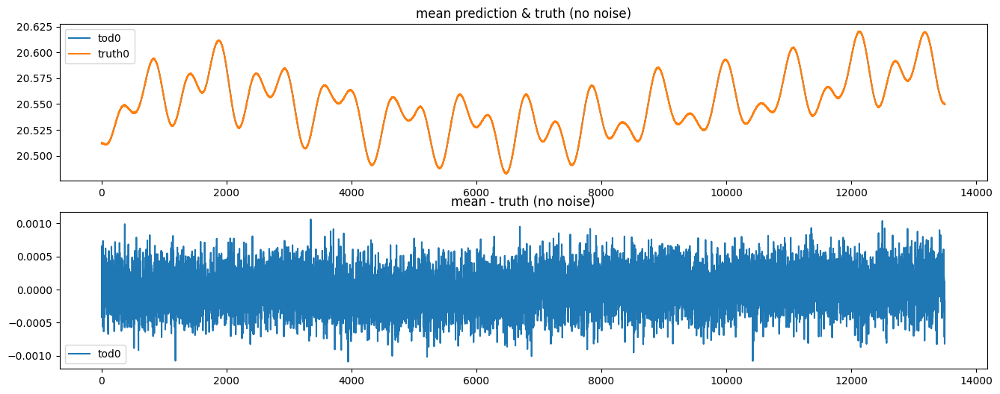

OPTIMIZE_KL: Starting 0043
SL: Iteration 0 ⛰:+9.5335e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+2.2034e+07 Δ⛰:7.3301e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+6.0083e+06 Δ⛰:1.6026e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.4883e+06 Δ⛰:3.5200e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.7921e+06 Δ⛰:6.9621e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1008e+06 Δ⛰:6.9131e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.7199e+05 Δ⛰:5.2879e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.5295e+05 Δ⛰:1.1903e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.4990e+05 Δ⛰:1.0305e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.6730e+05 Δ⛰:8.2603e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.6380e+05 Δ⛰:3.5018e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.7239e+05 Δ⛰:9.1409e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2096e+05 Δ⛰:5.1426e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.3914e+04 Δ⛰:2.7048e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.8725e+04 Δ⛰:2.5189e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.6286e+04 Δ⛰:2.4383e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.8670e+04 Δ⛰:7.6167e+03 ➽:1.5503e-01
SL: 

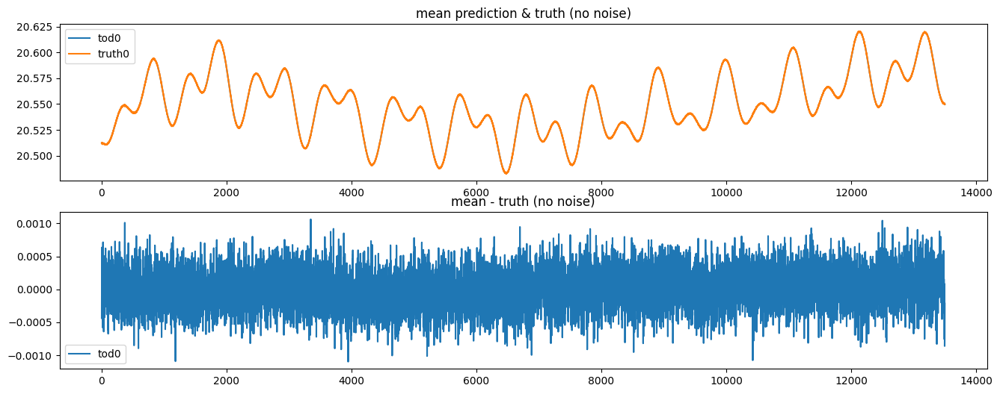

OPTIMIZE_KL: Starting 0044
SL: Iteration 0 ⛰:+7.9051e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+3.9695e+07 Δ⛰:3.9357e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+5.1687e+06 Δ⛰:3.4526e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.8287e+06 Δ⛰:3.3401e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0584e+06 Δ⛰:7.7028e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+9.7490e+05 Δ⛰:8.3487e+04 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.7789e+05 Δ⛰:4.9702e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.7918e+05 Δ⛰:9.8708e+04 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.9302e+05 Δ⛰:8.6154e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.0988e+05 Δ⛰:8.3143e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.8611e+05 Δ⛰:2.3770e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.8524e+05 Δ⛰:8.7410e+02 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2157e+05 Δ⛰:6.3666e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.1662e+04 Δ⛰:3.9909e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.2957e+04 Δ⛰:1.8705e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.2373e+04 Δ⛰:5.8359e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.8067e+04 Δ⛰:4.3063e+03 ➽:1.5503e-01
SL: 

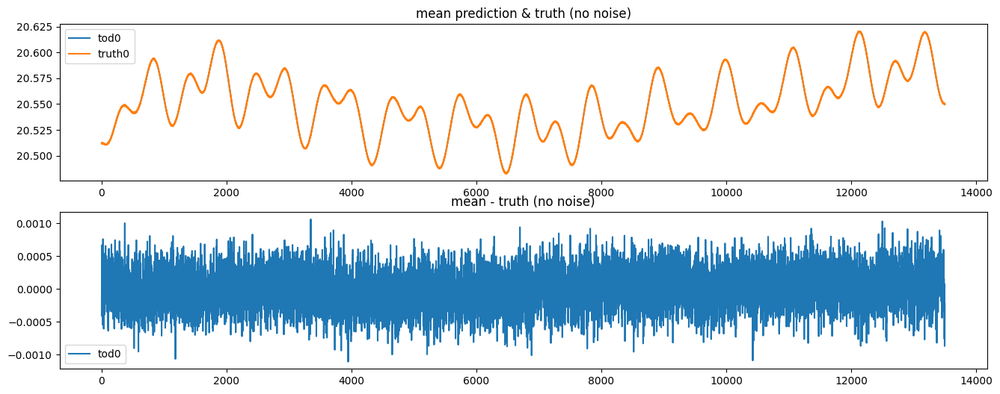

OPTIMIZE_KL: Starting 0045
SL: Iteration 0 ⛰:+3.8996e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+2.2954e+07 Δ⛰:1.6042e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+8.7903e+06 Δ⛰:1.4164e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+3.0784e+06 Δ⛰:5.7119e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+2.2028e+06 Δ⛰:8.7560e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1055e+06 Δ⛰:1.0973e+06 ➽:1.5503e-01
SL: Iteration 6 ⛰:+4.6683e+05 Δ⛰:6.3868e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.4101e+05 Δ⛰:1.2582e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.6244e+05 Δ⛰:7.8569e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.7134e+05 Δ⛰:9.1098e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.6796e+05 Δ⛰:3.3797e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.3235e+05 Δ⛰:3.5614e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.0882e+05 Δ⛰:2.3528e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+8.4921e+04 Δ⛰:2.3903e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.1828e+04 Δ⛰:2.3094e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.0995e+04 Δ⛰:8.3273e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.5388e+04 Δ⛰:5.6068e+03 ➽:1.5503e-01
SL: 

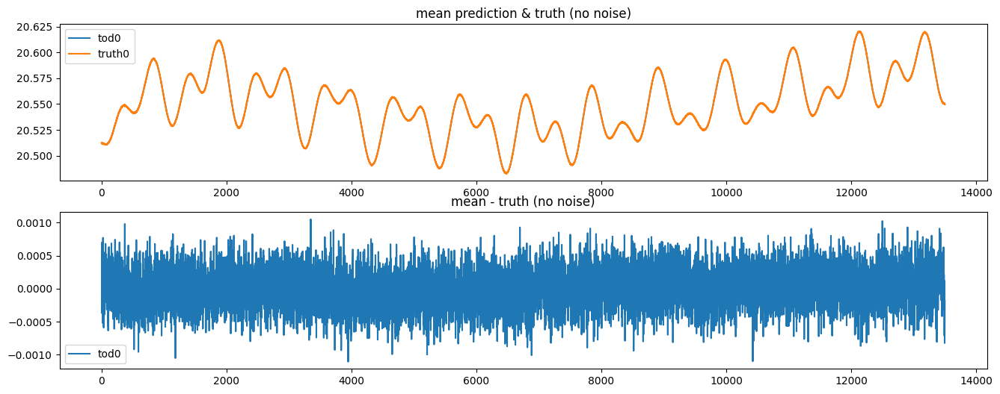

OPTIMIZE_KL: Starting 0046
SL: Iteration 0 ⛰:+3.8408e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+1.8289e+07 Δ⛰:2.0119e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.5183e+06 Δ⛰:1.3771e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+2.2876e+06 Δ⛰:2.2308e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.8581e+06 Δ⛰:4.2949e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.4152e+06 Δ⛰:4.4286e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+7.0892e+05 Δ⛰:7.0629e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.5928e+05 Δ⛰:3.4964e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.7045e+05 Δ⛰:8.8825e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.3736e+05 Δ⛰:3.3088e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+2.1899e+05 Δ⛰:1.8375e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.9288e+05 Δ⛰:2.6112e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2148e+05 Δ⛰:7.1400e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.3309e+04 Δ⛰:2.8167e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+7.8825e+04 Δ⛰:1.4484e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+7.2990e+04 Δ⛰:5.8348e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+7.2461e+04 Δ⛰:5.2904e+02 ➽:1.5503e-01
SL: 

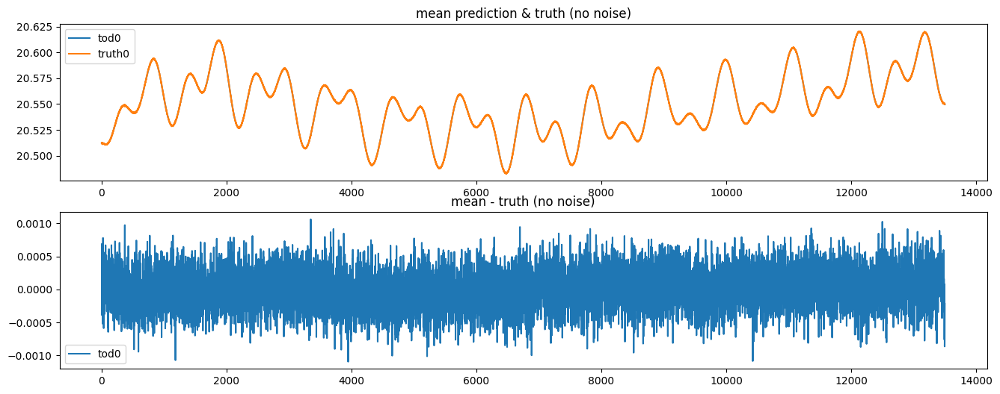

OPTIMIZE_KL: Starting 0047
SL: Iteration 0 ⛰:+8.8643e+06 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+6.6265e+06 Δ⛰:2.2378e+06 ➽:1.5503e-01
SL: Iteration 2 ⛰:+4.4151e+06 Δ⛰:2.2114e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.8338e+06 Δ⛰:2.5813e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.4299e+06 Δ⛰:4.0382e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.1168e+06 Δ⛰:3.1310e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.7095e+05 Δ⛰:5.4589e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.2500e+05 Δ⛰:1.4595e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.6242e+05 Δ⛰:1.6258e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.8489e+05 Δ⛰:7.7533e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.3384e+05 Δ⛰:5.1045e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.3203e+05 Δ⛰:1.8128e+03 ➽:1.5503e-01
SL: Iteration 12 ⛰:+9.0390e+04 Δ⛰:4.1638e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.3948e+04 Δ⛰:1.6442e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.4902e+04 Δ⛰:9.0462e+03 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.4773e+04 Δ⛰:1.2840e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.5353e+04 Δ⛰:9.4202e+03 ➽:1.5503e-01
SL: 

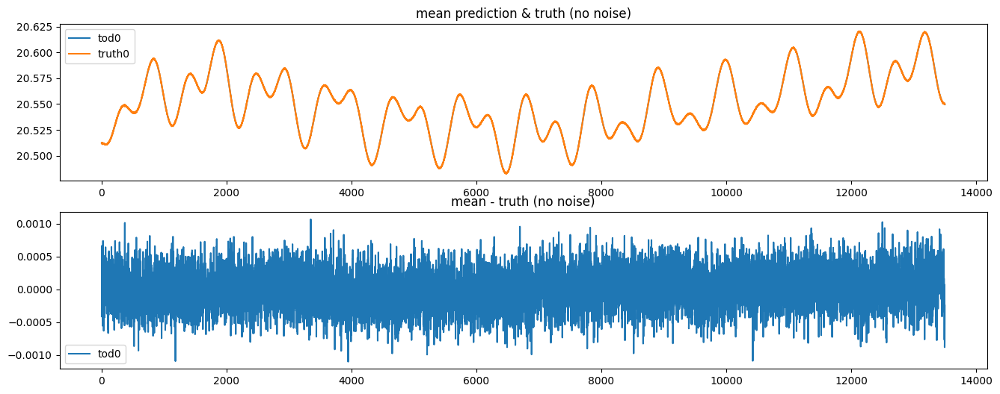

OPTIMIZE_KL: Starting 0048
SL: Iteration 0 ⛰:+5.1341e+07 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+8.4015e+06 Δ⛰:4.2939e+07 ➽:1.5503e-01
SL: Iteration 2 ⛰:+3.4014e+06 Δ⛰:5.0001e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.8590e+06 Δ⛰:1.5425e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.4489e+06 Δ⛰:4.1012e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+1.0022e+06 Δ⛰:4.4670e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.5028e+05 Δ⛰:4.5187e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+4.3642e+05 Δ⛰:1.1386e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0463e+05 Δ⛰:1.3179e+05 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.3666e+05 Δ⛰:6.7974e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.9043e+05 Δ⛰:4.6224e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.8299e+05 Δ⛰:7.4488e+03 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.3629e+05 Δ⛰:4.6695e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+1.1448e+05 Δ⛰:2.1809e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+1.0107e+05 Δ⛰:1.3415e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+8.8645e+04 Δ⛰:1.2423e+04 ➽:1.5503e-01
SL: Iteration 16 ⛰:+7.2706e+04 Δ⛰:1.5939e+04 ➽:1.5503e-01
SL: 

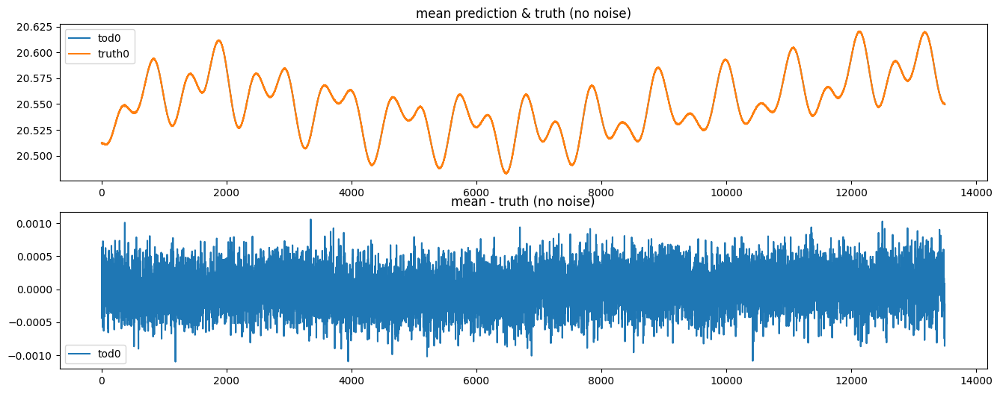

OPTIMIZE_KL: Starting 0049
SL: Iteration 0 ⛰:+1.3416e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+2.7753e+07 Δ⛰:1.0641e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+7.9801e+06 Δ⛰:1.9773e+07 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.5277e+06 Δ⛰:6.4524e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.2438e+06 Δ⛰:2.8394e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.8956e+05 Δ⛰:5.5424e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+5.1641e+05 Δ⛰:1.7316e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+3.7928e+05 Δ⛰:1.3712e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+3.0306e+05 Δ⛰:7.6228e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+2.4602e+05 Δ⛰:5.7034e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.5359e+05 Δ⛰:9.2435e+04 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.5221e+05 Δ⛰:1.3796e+03 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.2925e+05 Δ⛰:2.2961e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+9.3389e+04 Δ⛰:3.5856e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+6.9564e+04 Δ⛰:2.3825e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+6.7097e+04 Δ⛰:2.4673e+03 ➽:1.5503e-01
SL: Iteration 16 ⛰:+6.6418e+04 Δ⛰:6.7877e+02 ➽:1.5503e-01
SL: 

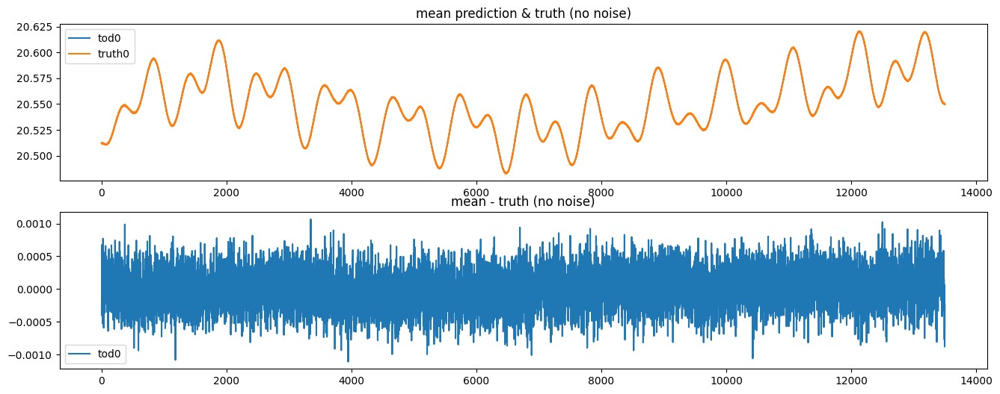

OPTIMIZE_KL: Starting 0050
SL: Iteration 0 ⛰:+2.9495e+08 Δ⛰:inf ➽:1.5503e-01
SL: Iteration 1 ⛰:+4.5239e+06 Δ⛰:2.9042e+08 ➽:1.5503e-01
SL: Iteration 2 ⛰:+2.2975e+06 Δ⛰:2.2264e+06 ➽:1.5503e-01
SL: Iteration 3 ⛰:+1.2283e+06 Δ⛰:1.0692e+06 ➽:1.5503e-01
SL: Iteration 4 ⛰:+1.0466e+06 Δ⛰:1.8167e+05 ➽:1.5503e-01
SL: Iteration 5 ⛰:+6.1178e+05 Δ⛰:4.3487e+05 ➽:1.5503e-01
SL: Iteration 6 ⛰:+3.8738e+05 Δ⛰:2.2440e+05 ➽:1.5503e-01
SL: Iteration 7 ⛰:+2.8467e+05 Δ⛰:1.0271e+05 ➽:1.5503e-01
SL: Iteration 8 ⛰:+2.3760e+05 Δ⛰:4.7068e+04 ➽:1.5503e-01
SL: Iteration 9 ⛰:+1.6376e+05 Δ⛰:7.3839e+04 ➽:1.5503e-01
SL: Iteration 10 ⛰:+1.6023e+05 Δ⛰:3.5308e+03 ➽:1.5503e-01
SL: Iteration 11 ⛰:+1.3410e+05 Δ⛰:2.6126e+04 ➽:1.5503e-01
SL: Iteration 12 ⛰:+1.0085e+05 Δ⛰:3.3249e+04 ➽:1.5503e-01
SL: Iteration 13 ⛰:+7.2766e+04 Δ⛰:2.8088e+04 ➽:1.5503e-01
SL: Iteration 14 ⛰:+5.9659e+04 Δ⛰:1.3107e+04 ➽:1.5503e-01
SL: Iteration 15 ⛰:+5.9078e+04 Δ⛰:5.8153e+02 ➽:1.5503e-01
SL: Iteration 16 ⛰:+5.3871e+04 Δ⛰:5.2071e+03 ➽:1.5503e-01
SL: 

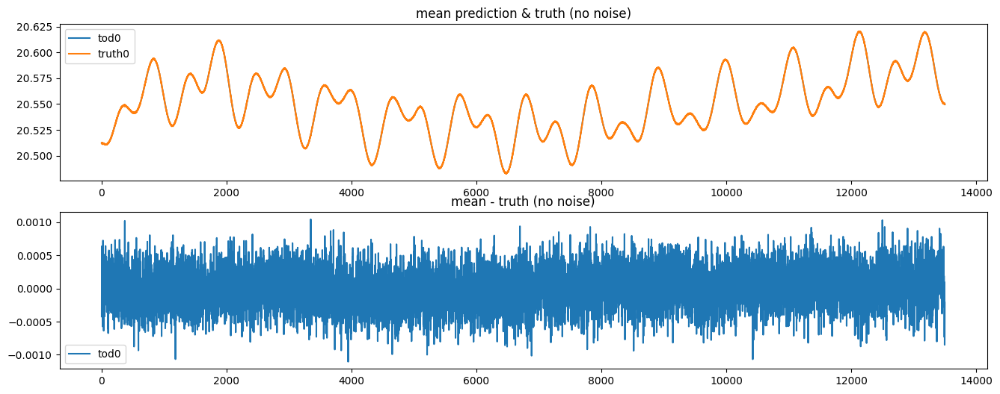

In [51]:
# n_it = 10
# n_it = 20
n_it = 50

if noiselevel == 0.0: delta = 1e-4
elif noiselevel == 0.1: delta = 1e-10
elif noiselevel == 0.5: delta = 1e-10
elif noiselevel == 1.0: delta = 1e-4
n_samples = 4 # no samples -> maximum aposteriory posterior

key, k_i, k_o = random.split(key, 3)

# callback fn for plotting during optimisation:
def callback(samples, opt_state):
    mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

    fig_tods, axes_tods = plt.subplots(2, 1, figsize=(16, 6))

    # for i in range(0, n, n//10):
    # for i in range(0, mean.shape[0], mean.shape[0]//10):
    for i in range(n):
        axes_tods[0].plot(np.arange(0, mean.shape[1]), mean[i], label=f"tod{i}")
        axes_tods[0].plot(denoised_jax_tod[i], label=f"truth{i}")
        axes_tods[1].plot(np.arange(0, mean.shape[1]), mean[i] - denoised_jax_tod[i], label=f"tod{i}")

    axes_tods[0].title.set_text('mean prediction & truth (no noise)')
    axes_tods[0].legend()
    axes_tods[1].title.set_text('mean - truth (no noise)')
    axes_tods[1].legend()

    # fig_map, axes_map = plt.subplots(1, 3, figsize=(16, 6))

    # mean_map, _ = jft.mean_and_std(tuple(gp_map(s)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] for s in samples))

    # im0 = axes_map[0].imshow(mean_map)
    # axes_map[0].title.set_text('mean map pred.')
    # fig_map.colorbar(im0)

    # im1 = axes_map[1].imshow(mean_map - mapdata_truth[0])
    # axes_map[1].title.set_text('mean map - truth')
    # fig_map.colorbar(im1)

    # im2 = axes_map[2].imshow(mapdata_truth[0])
    # axes_map[2].title.set_text('truth')
    # fig_map.colorbar(im2)

    plt.show()
    

samples, state = jft.optimize_kl(
    lh, # likelihood
    jft.Vector(lh.init(k_i)), # initial position in model space (initialisation)
    n_total_iterations=n_it, # no of optimisation steps (global)
    n_samples=n_samples, # draw samples
    key=k_o, # random jax init
    draw_linear_kwargs=dict( # sampling parameters
        cg_name="SL",
        cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=60),
        # cg_kwargs=dict(absdelta=delta * jft.size(lh.domain) / 10.0, maxiter=10),
    ),
    nonlinearly_update_kwargs=dict( # map from multivariate gaussian to more compl. distribution (coordinate transformations)
        minimize_kwargs=dict(
            name="SN",
            xtol=delta,
            cg_kwargs=dict(name=None),
            maxiter=5,
        )
    ),
    kl_kwargs=dict( # shift transformed multivar gauss to best match true posterior
        minimize_kwargs=dict(
            name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=60
            # name="M", xtol=delta, cg_kwargs=dict(name=None), maxiter=10
        )
    ),
    # sample_mode="nonlinear_resample", # how steps are combined (samples + nonlin + KL)
    sample_mode = lambda x: "nonlinear_resample" if x >= 1 else "linear_resample",
    callback=callback,
)

In [52]:
printfitresults()

Fit Results (res, init, std)

TODs:
	fluctuations: 0.01487576380091672, 0.005, 0.003
	loglogvarslope: -2.6594109629537517, -3, 0.5
	zeromode std (LogNormal): 0.003029686341708144, 0.0005, 0.001


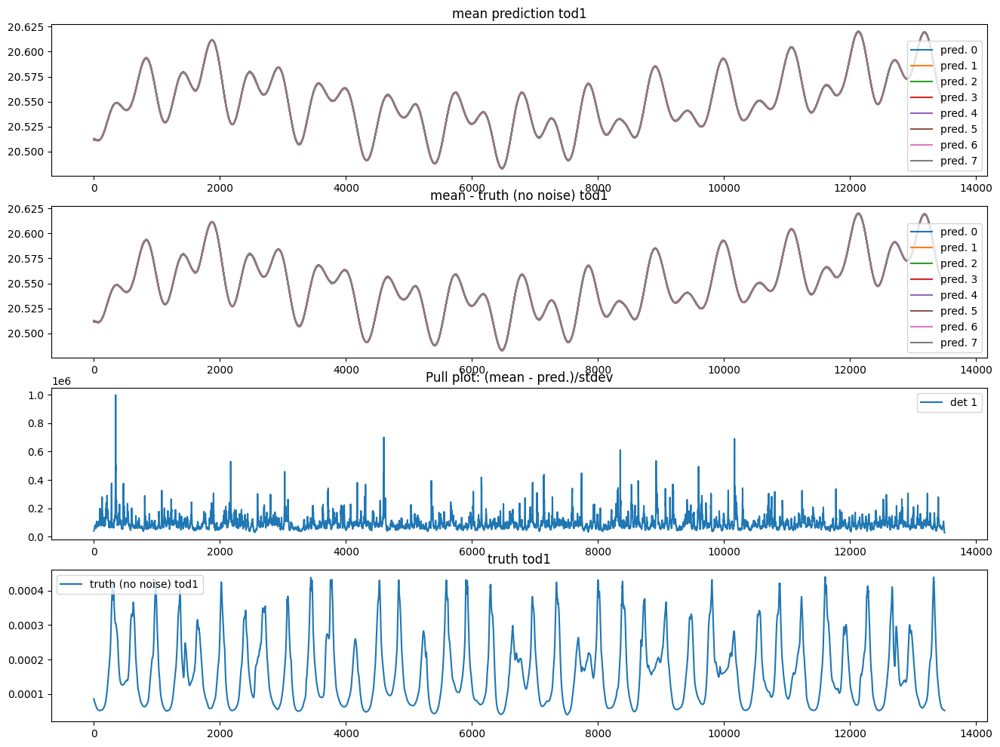

In [53]:
mean, std = jft.mean_and_std(tuple(signal_response_tod(s) for s in samples))

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

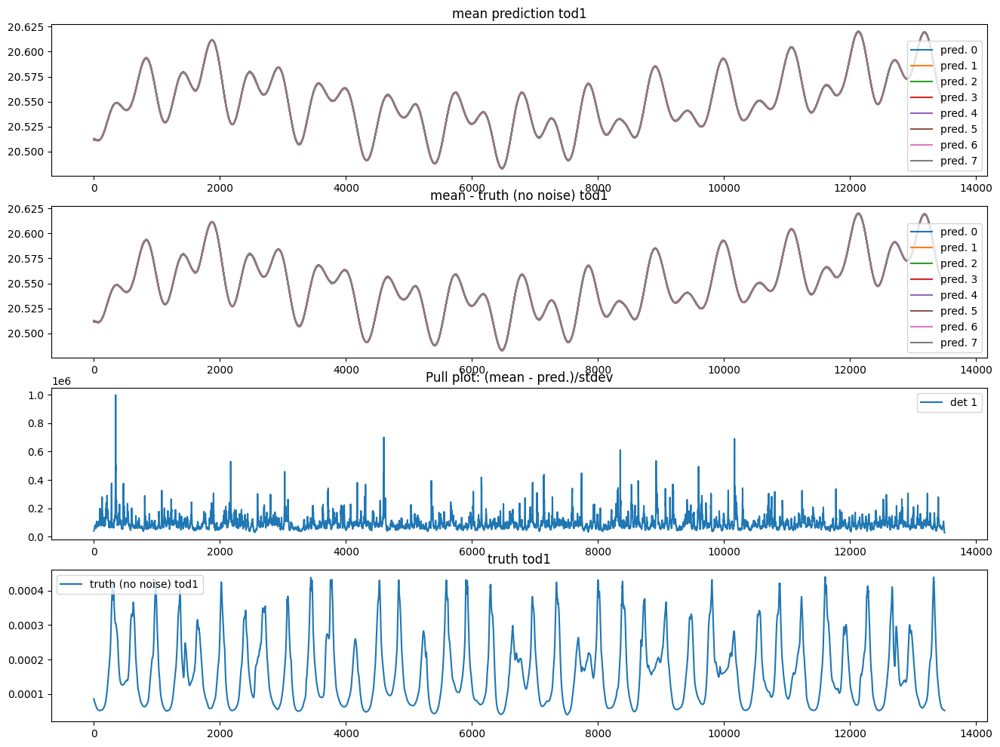

In [54]:
fig, axes = plt.subplots(4, 1, figsize=(16, 12))
i = 1 # TOD id
j = 0
# for i in range(mean.shape[0]):
for s in samples:
    pred = signal_response_tod(s)
    
    im0 = axes[0].plot(np.arange(0, pred.shape[1]), pred[i], label=f"pred. {j}")
    im1 = axes[1].plot(np.arange(0, pred.shape[1]), pred[i] - denoised_jax_tod[i], label=f"pred. {j}")
    j += 1

im2 = axes[2].plot(np.arange(0, pred.shape[1]), (mean[i] - denoised_jax_tod[i])/std[i], label=f"det {i}")
im3 = axes[3].plot(denoised_jax_tod[i], label=f"truth (no noise) tod{i}")
axes[0].title.set_text(f"mean prediction tod{i}")
axes[0].legend()
axes[1].title.set_text(f"mean - truth (no noise) tod{i}")
axes[1].legend()
axes[2].title.set_text(f"Pull plot: (mean - pred.)/stdev")
axes[2].legend()
axes[3].title.set_text(f"truth tod{i}")
axes[3].legend()

plt.show()

## Compare with maria mapper:

In [48]:
# # Compare with maria mapper:
# from maria.map.mappers import BinMapper

# mapper = BinMapper(center=(300.0, -10.0),
#                    frame="ra_dec",
#                    width=1.,
#                    height=1.,
#                    resolution=np.degrees(np.nanmin(instrument.fwhm))/4.,
#                    tod_postprocessing={
#                         "window": {"tukey": {"alpha": 0.1}},
#                         "remove_modes": {"n": 1},
#                         "highpass": {"f": 0.05},
#                         "despline": {"spacing": 10},
#                     },
#                     map_postprocessing={
#                         "gaussian_filter": {"sigma": 1},
#                         "median_filter": {"size": 1},
#                     },
#                   )


# mapper.add_tods(tod_truthmap)
# output_map = mapper.run()

In [49]:
# output_map.plot()

In [50]:
# from skimage.transform import resize

# # Compare nifty vs maria
# sig_map = gp_map(samples.pos)[padding_map//2:-padding_map//2, padding_map//2:-padding_map//2] # when splitting up in different field models
# # mincol = -0.0012
# # maxcol = 0.
# mincol = None
# maxcol = None

# cmb_cmap = plt.get_cmap('cmb')
# fig, axes = plt.subplots(3, 2, figsize=(16, 16))

# im0 = axes[0,0].imshow( mapdata_truth[0] , cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# axes[0,0].title.set_text('truth')
# fig.colorbar(im0)

# im1 = axes[0,1].imshow(np.flip(output_truthmap.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# fig.colorbar(im1)
# axes[0,1].title.set_text("Noisy image (Mapper output)")

# im2 = axes[1,0].imshow( np.flip(output_map.data[0], axis=(0,1)), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# axes[1,0].title.set_text('maria mapper')
# fig.colorbar(im2)

# truth_rescaled = resize(mapdata_truth[0], (841,841), anti_aliasing=True)
# im3 = axes[1,1].imshow(( np.flip(output_map.data[0], axis=(0,1)) - truth_rescaled), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# axes[1,1].title.set_text('maria - truth')
# fig.colorbar(im3)

# im3 = axes[2,0].imshow(sig_map, cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# axes[2,0].title.set_text('best fit image')
# fig.colorbar(im3)

# im4 = axes[2,1].imshow((sig_map - mapdata_truth[0]), cmap=cmb_cmap, vmin=mincol, vmax=maxcol)
# axes[2,1].title.set_text('best fit - truth')
# fig.colorbar(im4)

# plt.show()